# Car Sale Advert Analysis

### 1. Data/Domain Understanding and Exploration

This project's main goal is to build a regression model that would be used for predicting car prices. Although, I will be concentrating on only 3 regression algorithms, Linear Regression, Random Forest Regression and Gradient Boosted Tree Regression for which hyperparameter tunning will be deployed for model optimization after which a model selection will be made and the entire datset will be run on it. I will be making use of the dataset provided by [Auto Trader Group Plc](https://www.autotrader.co.uk/), a British online automotive advertising company whose platform, new and used vehicles are classified and put on the marketplace for possible purchase.

In [ ]:
!pip install -U scikit-learn==1.4.0 -q
!pip install --upgrade category_encoders -q
!pip install shap

# import the necessary libraries
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler, PolynomialFeatures
from category_encoders import TargetEncoder
import sklearn
sklearn.set_config(transform_output="pandas")
from sklearn.decomposition import PCA
from sklearn.inspection import PartialDependenceDisplay
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_validate
from sklearn.model_selection import RandomizedSearchCV
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.feature_selection import RFECV
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.tree import export_text
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import VotingRegressor

import warnings
warnings.filterwarnings('ignore')
sns.set(
    { "figure.figsize": (5, 4) },
    style='ticks',
    color_codes=True,
    font_scale=0.8
)
%config InlineBackend.figure_format = 'retina'
import warnings

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 27.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.5/540.5 kB 6.9 MB/s eta 0:00:00


In [ ]:
# The file
Ad = pd.read_csv('path_to_dataset.csv')

In [ ]:
# See the structure of the dataset
Ad.head(3)

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,2.020060e+14,0.0,NaN,Grey,Volvo,XC90,NEW,NaN,73970,SUV,False,Petrol Plug-in Hybrid
1,2.020070e+14,108230.0,61,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel
2,2.020070e+14,7800.0,17,Grey,SKODA,Yeti,USED,2017.0,14000,SUV,False,Petrol


### Understanding the various features

This dataset is comprised of 12 columns with multiple datatypes that are quantitative and categorical, where the price column is the target variable.

public_reference: This is an illustration of the unique identifier

mileage: Indicates the mileage that the car has traveled.

year of registration: The initial year that the vehicle was registered

reg_code: The car's registration code at the time of purchase

standard_color: The color of the car is shown in this column.

standard_make: The vehicle's brand or manufacturer

standard_model: This is the base model that a company offers for a specific car model.

vehicle_condition: Describes the car's general condition.

year of registration: The initial year that the vehicle was registered

price: The amount listed in the car's advertisement

body_type: This column explains the general layout and style of a car's body.

crossover_car_and_van: This column indicates if the car has features from both an SUV and a car.

fuel_type: describes the kind of fuel that's used.

In [ ]:
Ad.info()

In [ ]:
Ad.describe(include = 'all')

The summary statistics table shows that there are null values in the mileage, reg_code, year_of_reg, body_type and fuel_type columns. With over 1000 unique values in the standard_model columns, it indicates high cardinality and Golf tops the list, same also for standard_make with over 100 unique values where BMW tops the chart. Body_type and fuel_type have moderate cardinality of 16 and 9 respectively. Black color dominates and the vehicle condition shows that majority of the dataset are Used vehicles. Most parts of the dataset lie between the year 2013 and 2018. Additionally, price ranges averagely between 7500 and 20000 pounds. The wide range between the 25th and 75th percentiles of approximately 10,400 to 57,000 in the mileage column connotes a substantial spread in the dataset likewise in the price column. Given the median of approximately 29,000 being significantly lower than the mean of 37,700, it is indicative of a right skewed distribution. Same is seen for the price column which is explained by the value of standard variation. Lastly, practically all the dataset can be said not to be crossover_car_van vehicles which makes it one of the major reasons why it would be dropped subsequently to enhance our computational power.

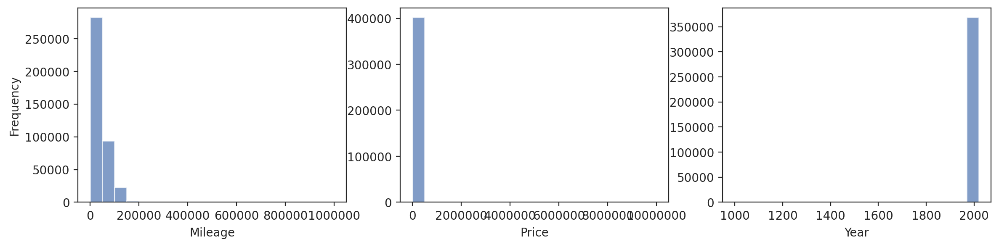

In [ ]:
# Visualizing the distribution of the price, mileage and year column
fig, axs = plt.subplots(1, 3, figsize=(14, 3))
axs[0].hist(Ad['mileage'], bins=20, alpha = 0.7)
axs[0].set_xlabel('Mileage')
axs[0].set_ylabel('Frequency')
axs[0].ticklabel_format(style='plain')
axs[1].hist(Ad['price'], bins=20, alpha = 0.7)
axs[1].set_xlabel('Price')
axs[1].ticklabel_format(style='plain')
axs[2].hist(Ad['year_of_registration'], bins=20, alpha = 0.7)
axs[2].set_xlabel('Year');

Data Preparation and Preprocessing

In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin

# Replaces Year of registration for New Vehicles

class ReplaceYearForNewVehicles(BaseEstimator, TransformerMixin):
    def __init__(self, current_year=2021):
        self.current_year = current_year

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X['year_of_registration'] = X.apply(lambda row: self.current_year if row['vehicle_condition'] == "NEW"
                                             else row["year_of_registration"], axis=1)
        return X

The above function handles the row values in the year of registration column where the vehicles are new. It transforms NaN values to the current year 2021, presumably the year the dataset was generated.This fixed date maintains the duration even even with passage of time.

In [ ]:
class MapRegistrationCodesToYears(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.a_dict = {'7': 2007, '8': 2008, '10': 2010, '13': 2013, '17': 2017, '55': 2005,
                       '57': 2007, '59': 2009, '63': 2013, '64': 2014, '65': 2015, '66': 2016, '68': 2018}
        self.alphabets = {'A':1963, 'B':1964, 'C':1965, 'D':1966, 'E':1967, 'F':1968, 'G':1969, 'H':1970,
                          'J':1971, 'K':1972, 'L':1973, 'M':1974, 'N':1975, 'P':1976, 'R':1977, 'S':1978,
                          'T':1979, 'V':1980, 'W':1981, 'X':1982, 'Y':1983}
        self.D = {str(regcode): year for regcode, year in zip(range(2, 24), range(2002, 2024))}
        self.D2 = {str(regcode): year for regcode, year in zip(range(51, 73), range(2002, 2024))}

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        # Mapping registration codes to years based on the information contained
        X.loc[X['year_of_registration'] < 1904, 'year_of_registration'] = X.loc[X['year_of_registration'] < 1904,
                                                                               'reg_code'].map(self.a_dict)
        # Mapping registration codes to years using alphabets and ranges
        X.loc[X['year_of_registration'].isnull(), 'year_of_registration'] = X.loc[X['year_of_registration'].isnull(),
                                                                                 'reg_code'].map(self.alphabets)
        X.loc[X['year_of_registration'].isnull(), 'year_of_registration'] = X.loc[X['year_of_registration'].isnull(),
                                                                                 'reg_code'].map(self.D)
        X.loc[X['year_of_registration'].isnull(), 'year_of_registration'] = X.loc[X['year_of_registration'].isnull(),
                                                                                 'reg_code'].map(self.D2)

        # Filling missing values for 'year_of_registration' for USED vehicles with mode
        condition = (X['vehicle_condition'] == 'USED')
        X.loc[condition, 'year_of_registration'] = X[condition]['year_of_registration'].fillna(
            X[condition]['year_of_registration'].mode()[0])

        # Adjusting specific conditions
        specific_condition = (X['year_of_registration'] == 1909) & (X['reg_code'] == '9') & \
                             (X['standard_make'] == 'Hyundai') & (X['standard_model'] == 'i10')
        X.loc[specific_condition, 'year_of_registration'] = 2009

        return X


The UK car registration system allows us to know the age of a car via its plate number. Where there the reg_code and year_of_registration columns represent  the same idea, both columns can play complementary roles of filling up missing values. Although having both columns will further enhance data redundancy, for that reason, reg_code column will be dropped after filling up the year_of_registration column.

The aim here is to create 3 sets of dictionaries of keys (reg_code) matched to values (years) based on the information provided on the UK car registration wikipedia page. Given limited information with respect to the alphabets in the reg_code column, we base our assumption that the letters represent the suffix

Based on the assertion that new vehicles are highly unlikely to have reg_code and given that reg_code are age identifiers deduced from the year of registration, it therefore means that where the vehicle is new, corresponding row values to year_of_registration and reg_code may be without values as opposed to used vehicles. Refer here for further reading on UK car registration.

From above, we can confirm that the number of new vehicles with registration code is 0, this means that while the total number of new unregistered vehicles 25800 make up the value of 26127, it therefore indicates that about 327 used vehicles without year of registration will be filled with the mode.

Further Investigation on Year of registration.

This is in order to spot and rectify discrepancies that may be seen in the dataset. Car registration did not start in the UK not until 1904, slicing the dataset to further ensure a clean dataset, we check for any possible period prior to 1904 that may appear in our dataset.

We can infer from the wikipedia page that the implementation of car registration began in 1904. It therefore means that the periods prior to 1904 in the year_of_registration column will be flagged as possible entry errors, and given the relationship between reg_code and year_of_registration columns, we can make deductions based on the system. Creating a new dictionary, we replace the values within the periods in view. To further justify these corrections, Toyota only began operations in 1934, the German brand, Audi began manufacturing in 1909, Smart in 1994, the british brand Mini(Cooper works) in 1959 although owned by BMW since 2000 who began production of automobiles in 1928. Italian car brand Fiat whose history in the automobile business can be traced as far back as 1899, Japan automobile company Mazda began its car operations in 1931 and finally Mercedes-Benz, began operations as a merged company in 1926.

Looking at the minimum year, which implies the oldest year, we discover a high value which could be a vintage car. Nevertheless, we will need to examine to rule out doubts.

Hyundai i10 model was first introduced in 2008. Even the conception of the company was in 1967 which indicates possible entry error. Based on the reg_code, we replace with the appropriate year with the year when the car model was first manufactured

In [ ]:
class DataPreprocessor:
    def __init__(self):
        pass

    def fit_transform(self, data):
        # Remove duplicates
        data.drop_duplicates(inplace=True)

        # Rename columns
        old_new = {'standard_colour': 'colour', 'standard_make': 'make', 'standard_model': 'model',
                   'vehicle_condition': 'condition', 'year_of_registration': 'year', 'body_type': 'body',
                   'crossover_car_and_van': 'crossover', 'fuel_type': 'fuel'}
        data.rename(columns=old_new, inplace=True)

        # Handle extreme price values
        extreme = (data['price'] == 9999999)
        price_mode_by_year_make = data.groupby(['make', 'year'])['price'].transform(lambda x: x.mode().iloc[0])
        data.loc[extreme, 'price'] = price_mode_by_year_make[extreme]

        # Create age column
        current_year = 2021
        data['age'] = current_year - data['year']

        # Remove suspicious mileage entries
        data = data[data['mileage'] != 999999]

        # Create status column
        data['status'] = 'non_scrab'
        data.loc[(data['mileage'] >= (10000 * data['age'])) & (data['age'] > 10), 'status'] = 'scrab'

        categorical_cols = ['colour', 'fuel', 'body']

        # Fill missing values in categorical columns based on year mode
        for col in categorical_cols:
            data[col] = data.groupby(['year'])[col].transform(lambda x: x.fillna(x.mode().iloc[0] if not x.isnull().all() else pd.NA))

        # Fill missing values in categorical columns based on year and make mode
        for col in categorical_cols:
            data[col] = data.groupby(['age', 'make'])[col].transform(lambda x: x.fillna(x.mode().iloc[0]))

        # Using the mileage values provided for used vehicles to generate a subset
        subset = data[(data["condition"] == 'USED') & (data["mileage"] > 0)]
        mean_mileage = subset["mileage"].mean()
        data.loc[(data["condition"] == 'USED') & ((data["mileage"] == 0) | data["mileage"].isnull()), "mileage"] = mean_mileage

        # Drop columns
        data.drop(columns=['public_reference', 'reg_code', 'year', 'crossover'], inplace=True)

        # Create state column
        data['state'] = 'modern'
        data.loc[(data['age'] >= 45) & (data['age'] <= 117), 'state'] = 'vin_ant'  # represents years between 1904 and 1976
        data.loc[(data['age'] > 20) & (data['age'] <= 45), 'state'] = 'classics'  # represents years between 1976 and 2001

        return data


Also, observing the above summary result, it is discovered that the the maximum value for price shows as high as 9,999,999 pounds. For more insights, we scan through the rows

Considering dropping these rows may not entirely be the first point of call. Inspite that these may be luxury cars nevertheless, having price tags as high as close to a million pounds for used vehicles registered within a decade and close, may not entirely be realistic. This will be handled by replacing the price column where it is 9999999 with the mode value of the make of the value within that year.

Handling missing values for the mileage column of used cars

Another column of concern to establish for possible outliers, errors and misconception is the mileage column. It is logical to think that new cars should have little or no mileage. However, where the mileage of a used car is zero, it would be replaced with the mean value of the entire row of used cars.

According to NimbleFins, the average range of miles per year motorist travel in the UK ranges between 6,000 to 10,000 miles which depends on several factors like usage, fuel_type and even car make and model. As pointed out here, Spencer stated that while petrol cars travelled as far as approximately 7500 miles, diesel cars did 12,500. He even went further to state that company cars travelled as much as 18,000. Although Fleetnews posits that according to a recent study on MOT data, less than 5% of vehicles travelled up to 15000 miles in 2021. From the result above, the maximum value shows that the average miles covered per year ranges up to approximately 100,000 miles. While it is not impossible, it is very rare and unrealistic given their ages.

Dropped rows with mileage 999999 miles where it appears to be a entry error as seen in price column

Created a new column, status and making the default value non_scrab while scrab for cars with value (10000*age) greater than their corresponding mileage column and age greater than 10

Lastly, Filled up missing values in categorical columns with the most ocurring value for each year and make

In [ ]:
# Instantiate the object
replaceyear = ReplaceYearForNewVehicles()
# Fitting it into the dataset
Ad = replaceyear.fit_transform(Ad)
Ad.describe(include = 'all')

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
count,4.020050e+05,401878.000000,370148,396627,402005,402005,402005,399943.000000,4.020050e+05,401168,402005,401404
unique,NaN,NaN,72,22,110,1168,2,NaN,NaN,16,2,9
top,NaN,NaN,17,Black,BMW,Golf,USED,NaN,NaN,Hatchback,False,Petrol
freq,NaN,NaN,36738,86287,37376,11583,370756,NaN,NaN,167315,400210,216929
mean,2.020069e+14,37743.595656,NaN,NaN,NaN,NaN,NaN,2015.474523,1.734197e+04,NaN,NaN,NaN
std,1.691466e+10,34831.724018,NaN,NaN,NaN,NaN,NaN,7.812666,4.643746e+04,NaN,NaN,NaN
min,2.013070e+14,0.000000,NaN,NaN,NaN,NaN,NaN,999.000000,1.200000e+02,NaN,NaN,NaN
25%,2.020090e+14,10481.000000,NaN,NaN,NaN,NaN,NaN,2014.000000,7.495000e+03,NaN,NaN,NaN
50%,2.020090e+14,28629.500000,NaN,NaN,NaN,NaN,NaN,2017.000000,1.260000e+04,NaN,NaN,NaN
75%,2.020100e+14,56875.750000,NaN,NaN,NaN,NaN,NaN,2018.000000,2.000000e+04,NaN,NaN,NaN


In [ ]:
# Instantiate the object
mapreg = MapRegistrationCodesToYears()
# Fitting it into the dataset
Ad = mapreg.fit_transform(Ad)
Ad.describe(include = 'all')

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
count,4.020050e+05,401878.000000,370148,396627,402005,402005,402005,402005.000000,4.020050e+05,401168,402005,401404
unique,NaN,NaN,72,22,110,1168,2,NaN,NaN,16,2,9
top,NaN,NaN,17,Black,BMW,Golf,USED,NaN,NaN,Hatchback,False,Petrol
freq,NaN,NaN,36738,86287,37376,11583,370756,NaN,NaN,167315,400210,216929
mean,2.020069e+14,37743.595656,NaN,NaN,NaN,NaN,NaN,2015.518842,1.734197e+04,NaN,NaN,NaN
std,1.691466e+10,34831.724018,NaN,NaN,NaN,NaN,NaN,4.501173,4.643746e+04,NaN,NaN,NaN
min,2.013070e+14,0.000000,NaN,NaN,NaN,NaN,NaN,1933.000000,1.200000e+02,NaN,NaN,NaN
25%,2.020090e+14,10481.000000,NaN,NaN,NaN,NaN,NaN,2014.000000,7.495000e+03,NaN,NaN,NaN
50%,2.020090e+14,28629.500000,NaN,NaN,NaN,NaN,NaN,2017.000000,1.260000e+04,NaN,NaN,NaN
75%,2.020100e+14,56875.750000,NaN,NaN,NaN,NaN,NaN,2018.000000,2.000000e+04,NaN,NaN,NaN


In [ ]:
# Instantiate the object
dpro = DataPreprocessor()
# Fitting it into the dataset
Ad = dpro.fit_transform(Ad)
Ad.describe(include = 'all')

,mileage,colour,make,model,condition,price,body,fuel,age,status,state
count,395034.000000,395034,395034,395034,395034,3.950340e+05,395034,395034,395034.000000,395034,395034
unique,NaN,22,110,1168,2,NaN,16,9,NaN,2,3
top,NaN,Black,BMW,Golf,USED,NaN,Hatchback,Petrol,NaN,non_scrab,modern
freq,NaN,87634,37270,11487,369234,NaN,164584,212297,NaN,390754,392479
mean,38401.675783,NaN,NaN,NaN,NaN,1.706398e+04,NaN,NaN,5.569288,NaN,NaN
std,34716.684488,NaN,NaN,NaN,NaN,2.591572e+04,NaN,NaN,4.484663,NaN,NaN
min,0.000000,NaN,NaN,NaN,NaN,1.200000e+02,NaN,NaN,0.000000,NaN,NaN
25%,11395.000000,NaN,NaN,NaN,NaN,7.480000e+03,NaN,NaN,3.000000,NaN,NaN
50%,29339.500000,NaN,NaN,NaN,NaN,1.249500e+04,NaN,NaN,4.000000,NaN,NaN
75%,57354.750000,NaN,NaN,NaN,NaN,1.999500e+04,NaN,NaN,7.000000,NaN,NaN


## Applying Log and Root transforms

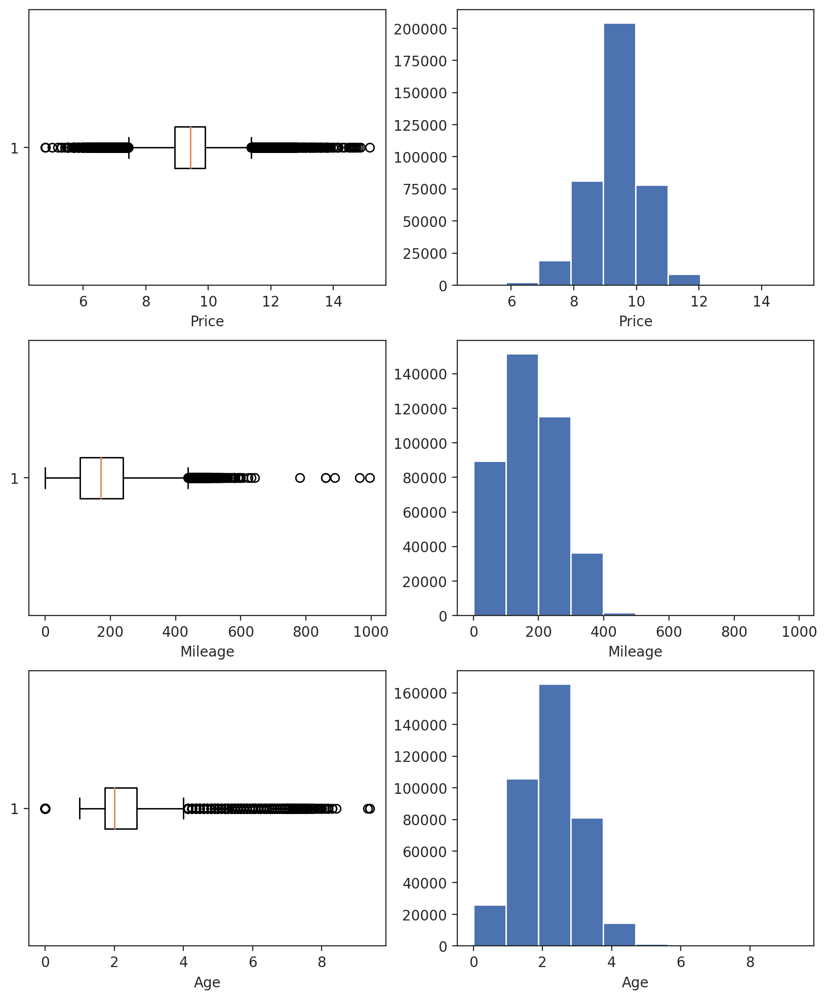

In [ ]:
#To cushion the effect of extreme outliers, I would use the square root and log function

Ad['price'] = np.log(Ad['price'])
Ad['mileage'] = np.sqrt(Ad['mileage'])
Ad['age'] = np.sqrt(Ad['age'])

fig, axs = plt.subplots(3, 2, figsize=(10, 12))

axs[0, 0].boxplot(Ad["price"], vert = False)
axs[0, 1].hist(Ad['price'])
axs[1, 0].boxplot(Ad["mileage"], vert = False)
axs[1, 1].hist(Ad['mileage'])
axs[2, 0].boxplot(Ad["age"], vert = False)
axs[2, 1].hist(Ad['age'])
axs[0, 0].set_xlabel('Price')
axs[0, 1].set_xlabel('Price')
axs[1, 0].set_xlabel('Mileage')
axs[1, 1].set_xlabel('Mileage')
axs[2, 0].set_xlabel('Age')
axs[2, 1].set_xlabel('Age');

## Split the dataset into categories for transformation

In [ ]:
sample = Ad.sample(frac = 0.1, random_state =0)
y = sample['price']
X = sample.drop('price', axis=1)

In [ ]:
# Splitting the dataframe into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)

In [ ]:
# Splitting the dataframe further into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=0)

In [ ]:
X_train.shape, y_train.shape,  X_test.shape, y_test.shape, X_val.shape, y_val.shape

((22220, 10), (22220,), (9876, 10), (9876,), (7407, 10), (7407,))

In [ ]:
numerical_features = X.select_dtypes(exclude='object').columns.tolist()

numerical_transformer = Pipeline(
        steps=[

            ("poly", PolynomialFeatures(degree = 2, include_bias = False)),
        ]
    )

preprocessor = ColumnTransformer(
        transformers=[
            ("num", numerical_transformer, numerical_features),
        ],
          remainder='passthrough',
          verbose_feature_names_out=False
    )

pipe_poly = Pipeline(steps=[
        ('preprocessor', preprocessor),

    ]).set_output(transform='pandas')


In [ ]:
pipe_poly.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('num',
                                                  Pipeline(steps=[('poly',
                                                                   PolynomialFeatures(include_bias=False))]),
                                                  ['mileage', 'age'])],
                                   verbose_feature_names_out=False))])

In [ ]:
X_train_poly = pipe_poly['preprocessor'].transform(X_train)

In [ ]:
X_train_poly.head()

,mileage,age,mileage^2,mileage age,age^2,colour,make,model,condition,body,fuel,status,state
45969,3.162278,0.000000,10.0,0.000000,0.0,Black,Audi,TTS,NEW,Convertible,Petrol,non_scrab,modern
85122,156.521564,2.236068,24499.0,349.992857,5.0,Blue,Mercedes-Benz,C Class,USED,Saloon,Diesel,non_scrab,modern
115099,129.050378,2.000000,16654.0,258.100756,4.0,Silver,Vauxhall,Astra,USED,Hatchback,Petrol,non_scrab,modern
373608,258.843582,2.449490,67000.0,634.034699,6.0,Orange,MINI,Hatch,USED,Hatchback,Diesel,non_scrab,modern
173098,191.619414,2.000000,36718.0,383.238829,4.0,Blue,Volkswagen,Polo,USED,Hatchback,Petrol,non_scrab,modern


Encode the categorical features for model building

In [ ]:
categorical_features = X.select_dtypes(include='object').columns.tolist()

categorical_transformer = Pipeline(
        steps=[

            ("te", TargetEncoder()),
        ]
    )

preprocessor = ColumnTransformer(
        transformers=[
            ("cat", categorical_transformer, categorical_features),
        ],
          remainder='passthrough',
          verbose_feature_names_out=False
    )

pipe_te = Pipeline(steps=[
        ('preprocessor', preprocessor),

    ]).set_output(transform='pandas')


In [ ]:
pipe_te.fit(X_train_poly, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('cat',
                                                  Pipeline(steps=[('te',
                                                                   TargetEncoder())]),
                                                  ['colour', 'make', 'model',
                                                   'condition', 'body', 'fuel',
                                                   'status', 'state'])],
                                   verbose_feature_names_out=False))])

In [ ]:
X_train_poly = pipe_te['preprocessor'].transform(X_train_poly)

In [ ]:
X_train_poly.head()

,colour,make,model,condition,body,fuel,status,state,mileage,age,mileage^2,mileage age,age^2
45969,9.463102,9.670999,9.644324,10.304689,9.568900,9.254172,9.396043,9.382098,3.162278,0.000000,10.0,0.000000,0.0
85122,9.348781,9.740452,9.711802,9.314838,9.603850,9.447194,9.396043,9.382098,156.521564,2.236068,24499.0,349.992857,5.0
115099,9.059657,8.812503,8.735859,9.314838,8.991884,9.254172,9.396043,9.382098,129.050378,2.000000,16654.0,258.100756,4.0
373608,9.425556,9.210719,9.148945,9.314838,8.991884,9.447194,9.396043,9.382098,258.843582,2.449490,67000.0,634.034699,6.0
173098,9.348781,9.351018,9.051582,9.314838,8.991884,9.254172,9.396043,9.382098,191.619414,2.000000,36718.0,383.238829,4.0


Applying the same transformations on the test dataset

In [ ]:
pipe_poly.fit(X_test, y_test)
X_test_poly = pipe_poly['preprocessor'].transform(X_test)
pipe_te.fit(X_test_poly, y_test)
X_test_poly = pipe_te['preprocessor'].transform(X_test_poly)

Applying the same transformations on the Validation dataset

In [ ]:
pipe_poly.fit(X_val, y_val)
X_val_poly = pipe_poly['preprocessor'].transform(X_val)
pipe_te.fit(X_val_poly, y_val)
X_val_poly= pipe_te['preprocessor'].transform(X_val_poly)

In [ ]:
def create_regr_ppln(est, X, scaling=False, linear_model=False, param_grid = None):
    """ """
    if param_grid is None:
        param_grid = {}
    if linear_model:
        # If linear model, scale
        preprocessor = MinMaxScaler()
    else:
        preprocessor = None
    regr_pipe = Pipeline(
        steps = [
            ('preprocessor', preprocessor), ('ransea', RandomizedSearchCV(est, param_distributions=param_grid, cv=5)),
            ]
          )
    return regr_pipe

In [ ]:
gbr_param_grid = {
    'n_estimators': list(range(5, 60)), 'criterion': ['squared_error','friedman_mse'], 'max_depth': list(range(5, 25)),
    'min_samples_split':list(range(4, 15)), 'min_samples_leaf':list(range(5, 30)),
    'max_features':list(range(15,70))+['sqrt', 'log2']
}
rfr_param_grid = {
    'n_estimators': list(range(5, 60)), 'criterion': ['squared_error','friedman_mse'], 'max_depth': list(range(5, 50)),
    'min_samples_split':list(range(4, 20)), 'min_samples_leaf':list(range(5, 50)),
    'max_features':list(range(15,80))+['sqrt', 'log2']
}
lr_param_grid = {
    'fit_intercept':[True,False], 'copy_X':[True,False], 'positive' : [True, False]
}

Buiding all 3 prosposed models using the original and polynomial generated features

In [ ]:
gbr  = create_regr_ppln(GradientBoostingRegressor(), X_train_poly, param_grid= gbr_param_grid)
rfr  = create_regr_ppln(RandomForestRegressor(), X_train_poly, param_grid= rfr_param_grid)
lr = create_regr_ppln(LinearRegression(), X_train_poly, linear_model=True, scaling= True, param_grid = lr_param_grid)

In [ ]:
models = [gbr, rfr, lr]

In [ ]:
model_results_list = []
for my_model in models:
    eval_results = cross_validate(
        my_model, X_train_poly, y_train, cv=5,
        scoring=['neg_mean_absolute_error', 'r2'],
        return_train_score=True
    )
    model_results_list.append((
    eval_results['test_r2'].mean(),
    eval_results['train_r2'].mean(),
    -eval_results['test_neg_mean_absolute_error'].mean(),
    eval_results['test_neg_mean_absolute_error'].std(),
    -eval_results['train_neg_mean_absolute_error'].mean(),
    eval_results['train_neg_mean_absolute_error'].std()

))

In [ ]:
model_results = pd.DataFrame(
    model_results_list,
    columns=['test_R2', 'train_R2', 'test_mae_mean', 'test_mae_std', 'train_mae_mean', 'train_mae_std',],
    index=['gbr', 'rfr', 'lr']
)

In [ ]:
model_results

,test_R2,train_R2,test_mae_mean,test_mae_std,train_mae_mean,train_mae_std
gbr,0.928504,0.967364,0.154894,0.002706,0.106924,0.017270
rfr,0.912619,0.940503,0.171656,0.003452,0.141553,0.008750
lr,0.851072,0.852442,0.236911,0.003068,0.236497,0.000842


In [ ]:
for est in models:
    est.fit(X_train_poly, y_train)

In [ ]:
ensemble = VotingRegressor(
    [
        ("gb", gbr),
        ("rf", rfr),
        ('lr', lr)
    ]
)
ensemble.fit(X_train_poly, y_train)

VotingRegressor(estimators=[('gb',
                             Pipeline(steps=[('preprocessor', None),
                                             ('ransea',
                                              RandomizedSearchCV(cv=5,
                                                                 estimator=GradientBoostingRegressor(),
                                                                 param_distributions={'criterion': ['squared_error',
                                                                                                    'friedman_mse'],
                                                                                      'max_depth': [5,
                                                                                                    6,
                                                                                                    7,
                                                                                                    8,
                                                                                                    9,
                                                                                                    10,
                                                                                                    11,
                                                                                                    12,
                                                                                                    13,
                                                                                                    14,
                                                                                                    15,
                                                                                                    16,
                                                                                                    17,
                                                                                                    18,
                                                                                                    19,
                                                                                                    20,
                                                                                                    21,
                                                                                                    22,
                                                                                                    23,
                                                                                                    24],
                                                                                      'max_features': [15,
                                                                                                       16,
                                                                                                       17,
                                                                                                       18,
                                                                                                       19,
                                                                                                       20,
                                                                                                       21,
                                                                                                       22,
                                                                                                       23,
                                                                                                       24,
                                                                                                       25,
                                                                                                       26,
                                                                       

In [ ]:
eval_results = cross_validate(
    ensemble, X_train_poly, y_train, cv=5,
    scoring=['neg_mean_absolute_error', 'r2'],
    return_train_score=True
)
ensemble_result = (
    eval_results['test_r2'].mean(),
    eval_results['train_r2'].mean(),
    -eval_results['test_neg_mean_absolute_error'].mean(),
    eval_results['test_neg_mean_absolute_error'].std(),
    -eval_results['train_neg_mean_absolute_error'].mean(),
    eval_results['train_neg_mean_absolute_error'].std()
)

In [ ]:
model_results.loc['ensemble'] = ensemble_result

In [ ]:
model_results

,test_R2,train_R2,test_mae_mean,test_mae_std,train_mae_mean,train_mae_std
gbr,0.928504,0.967364,0.154894,0.002706,0.106924,0.017270
rfr,0.912619,0.940503,0.171656,0.003452,0.141553,0.008750
lr,0.851072,0.852442,0.236911,0.003068,0.236497,0.000842
ensemble,0.915112,0.938773,0.171898,0.002412,0.148056,0.004287


## Inspection of Ensemble Output

In [ ]:
# quickly adapted from the sklearn documentation
# https://scikit-learn.org/stable/auto_examples/ensemble/plot_voting_regressor.html
xt = X_test_poly.head(1000)
yt = y_test.head(1000)
pred_gbr = gbr.predict(xt)
pred_rfr = rfr.predict(xt)
pred_lr = lr.predict(xt)
pred_ens = ensemble.predict(xt)

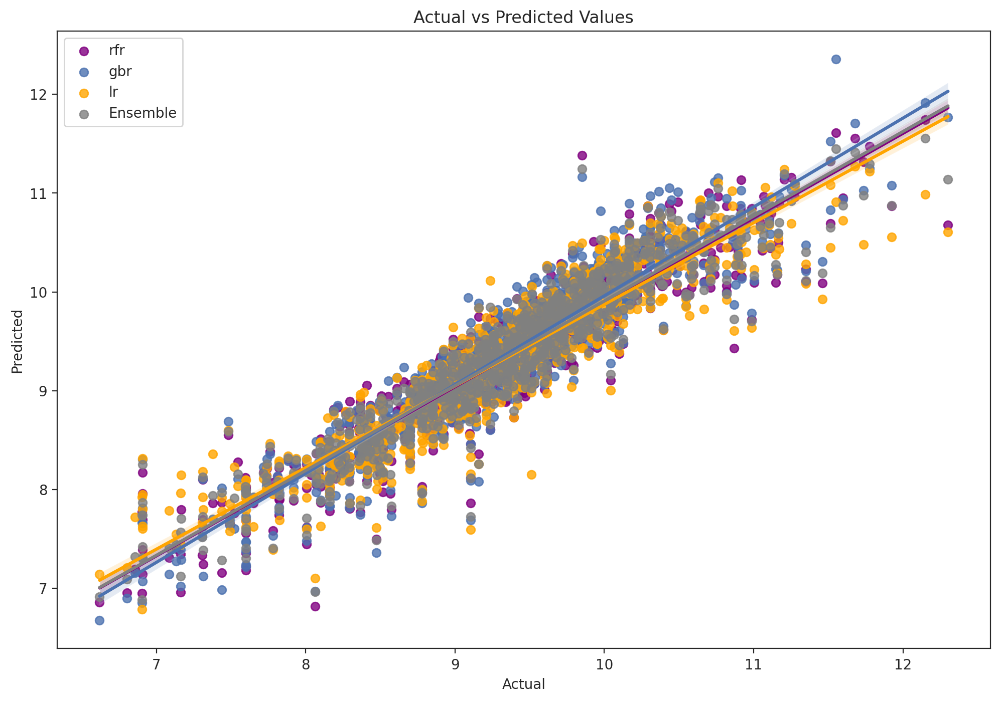

In [ ]:
fig, ax = plt.subplots(figsize=(12, 8))

sns.regplot(x=yt, y=pred_rfr, scatter_kws={"color": "purple"}, line_kws={"color": "purple"}, label="rfr")
sns.regplot(x=yt, y=pred_gbr, scatter_kws={"color": "b"}, line_kws={"color": "b"}, label="gbr")
sns.regplot(x=yt, y=pred_lr, scatter_kws={"color": "orange"}, line_kws={"color": "orange"}, label="lr")
sns.regplot(x= yt, y= pred_ens, scatter_kws={"color": "grey"}, line_kws={"color": "grey"}, label="Ensemble")
# sns.regplot(x= yt, y= pred_ens, scatter_kws={"color": "black"}, label="True values")


plt.title('Actual vs Predicted Values')
plt.xlabel('Actual')
plt.ylabel('Predicted')
ax.legend(loc="best");

plt.show()

In [ ]:
gbr.fit(X_train_poly, y_train)
rfr.fit(X_train_poly, y_train)
lr.fit(X_train_poly, y_train)


Pipeline(steps=[('preprocessor', MinMaxScaler()),
                ('ransea',
                 RandomizedSearchCV(cv=5, estimator=LinearRegression(),
                                    param_distributions={'copy_X': [True,
                                                                    False],
                                                         'fit_intercept': [True,
                                                                           False],
                                                         'positive': [True,
                                                                      False]}))])

In [ ]:
feat_coef = lr.named_steps['ransea'].best_estimator_.coef_
variable_names = X_train_poly.columns
feat_df = pd.DataFrame({'Feature': variable_names, 'Relevance': feat_coef})
feat_df = feat_df.reindex(feat_df['Relevance'].abs().sort_values(ascending=False).index)
feat_df

,Feature,Relevance
11,mileage age,-7.236218
12,age^2,5.247198
9,age,-2.562349
1,make,2.125863
10,mileage^2,1.420249
2,model,1.343970
8,mileage,1.312056
7,state,-0.768318
5,fuel,0.223955
4,body,0.178672


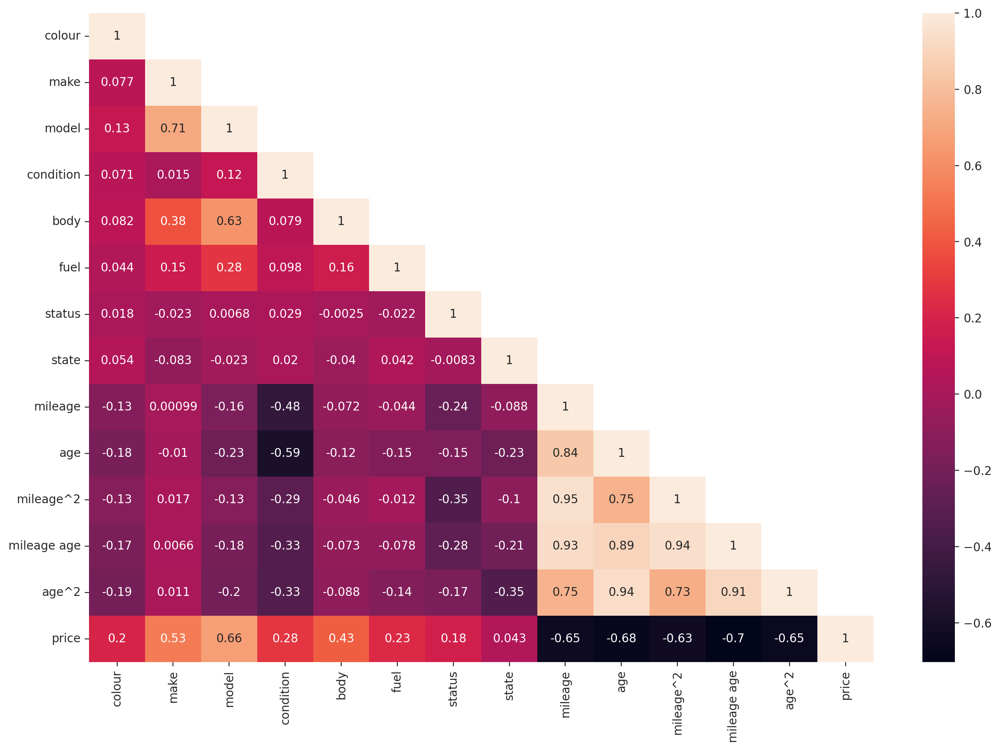

In [ ]:
corrplot = pd.concat([X_train_poly, y_train], axis=1)
plt.figure(figsize=(15, 10))
diag = np.triu(np.ones(corrplot.corr().shape, dtype=bool), k=1)
sns.heatmap(corrplot.corr(), mask = diag, annot=True);

Seeing how highly correlated age and mileage are, i will drop these features along side their square terms

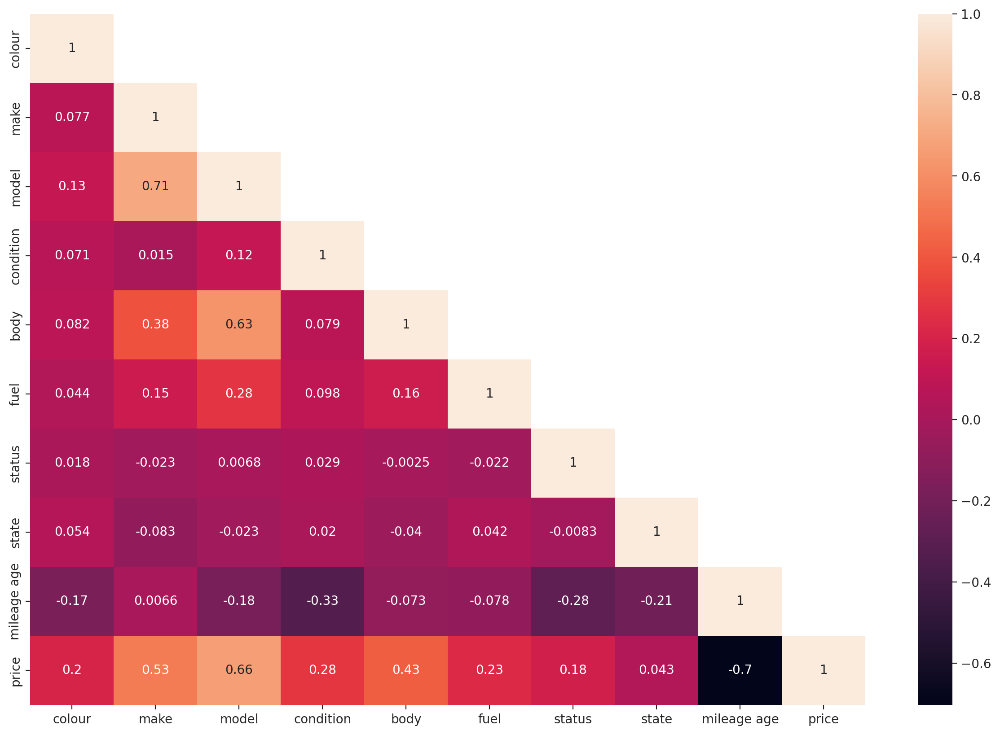

In [ ]:
X_train_poly = X_train_poly.drop(['mileage', 'age', 'mileage^2', 'age^2'], axis = 1)
corrplot = pd.concat([X_train_poly, y_train], axis=1)
plt.figure(figsize=(15, 10))
diag = np.triu(np.ones(corrplot.corr().shape, dtype=bool), k=1)
sns.heatmap(corrplot.corr(), mask = diag, annot=True);

Buiding and analyzing after manual selection

In [ ]:
gbr  = create_regr_ppln(GradientBoostingRegressor(), X_train_poly, param_grid= gbr_param_grid)
rfr  = create_regr_ppln(RandomForestRegressor(), X_train_poly, param_grid= rfr_param_grid)
lr = create_regr_ppln(LinearRegression(), X_train_poly, linear_model=True, scaling= True, param_grid = lr_param_grid)

In [ ]:
models = [gbr, rfr, lr]

In [ ]:
model_results_list = []
for my_model in models:
    eval_results = cross_validate(
        my_model, X_train_poly, y_train, cv=5,
        scoring=['neg_mean_absolute_error', 'r2'],
        return_train_score=True
    )
    model_results_list.append((
    eval_results['test_r2'].mean(),
    eval_results['train_r2'].mean(),
    -eval_results['test_neg_mean_absolute_error'].mean(),
    eval_results['test_neg_mean_absolute_error'].std(),
    -eval_results['train_neg_mean_absolute_error'].mean(),
    eval_results['train_neg_mean_absolute_error'].std()

))

In [ ]:
model_results = pd.DataFrame(
    model_results_list,
    columns=['test_R2', 'train_R2', 'test_mae_mean', 'test_mae_std', 'train_mae_mean', 'train_mae_std',],
    index=['gbr', 'rfr', 'lr']
)

In [ ]:
model_results

,test_R2,train_R2,test_mae_mean,test_mae_std,train_mae_mean,train_mae_std
gbr,0.919525,0.955714,0.163860,0.002164,0.124548,0.004248
rfr,0.904554,0.936258,0.179219,0.001291,0.146312,0.008403
lr,0.845691,0.846426,0.241446,0.003283,0.241205,0.000861


In [ ]:
for est in models:
    est.fit(X_train_poly, y_train)

In [ ]:
ensemble = VotingRegressor(
    [
        ("gb", gbr),
        ("rf", rfr),
        ('lr', lr)
    ]
)
ensemble.fit(X_train_poly, y_train)

VotingRegressor(estimators=[('gb',
                             Pipeline(steps=[('preprocessor', None),
                                             ('ransea',
                                              RandomizedSearchCV(cv=5,
                                                                 estimator=GradientBoostingRegressor(),
                                                                 param_distributions={'criterion': ['squared_error',
                                                                                                    'friedman_mse'],
                                                                                      'max_depth': [5,
                                                                                                    6,
                                                                                                    7,
                                                                                                    8,
                                                                                                    9,
                                                                                                    10,
                                                                                                    11,
                                                                                                    12,
                                                                                                    13,
                                                                                                    14,
                                                                                                    15,
                                                                                                    16,
                                                                                                    17,
                                                                                                    18,
                                                                                                    19,
                                                                                                    20,
                                                                                                    21,
                                                                                                    22,
                                                                                                    23,
                                                                                                    24],
                                                                                      'max_features': [15,
                                                                                                       16,
                                                                                                       17,
                                                                                                       18,
                                                                                                       19,
                                                                                                       20,
                                                                                                       21,
                                                                                                       22,
                                                                                                       23,
                                                                                                       24,
                                                                                                       25,
                                                                                                       26,
                                                                       

In [ ]:
eval_results = cross_validate(
    ensemble, X_train_poly, y_train, cv=5,
    scoring=['neg_mean_absolute_error', 'r2'],
    return_train_score=True
)
ensemble_result = (
    eval_results['test_r2'].mean(),
    eval_results['train_r2'].mean(),
    -eval_results['test_neg_mean_absolute_error'].mean(),
    eval_results['test_neg_mean_absolute_error'].std(),
    -eval_results['train_neg_mean_absolute_error'].mean(),
    eval_results['train_neg_mean_absolute_error'].std()
)

In [ ]:
model_results.loc['ensemble'] = ensemble_result

In [ ]:
model_results

,test_R2,train_R2,test_mae_mean,test_mae_std,train_mae_mean,train_mae_std
gbr,0.929147,0.965008,0.154775,0.004936,0.111461,0.018390
rfr,0.912760,0.941608,0.171985,0.004512,0.140383,0.010706
lr,0.851072,0.852442,0.236911,0.003068,0.236497,0.000842
ensemble,0.913665,0.936214,0.173402,0.002159,0.151248,0.007256


Using Recursive technique for dimensionalitry reduction on the subset of data after manual elimination

In [ ]:
# rfr  = create_regr_ppln(RandomForestRegressor(), X_train, param_grid= rfr_param_grid)
rfr.fit(X_train_poly, y_train)

Pipeline(steps=[('preprocessor', None),
                ('ransea',
                 RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(),
                                    param_distributions={'criterion': ['squared_error',
                                                                       'friedman_mse'],
                                                         'max_depth': [5, 6, 7,
                                                                       8, 9, 10,
                                                                       11, 12,
                                                                       13, 14,
                                                                       15, 16,
                                                                       17, 18,
                                                                       19, 20,
                                                                       21, 22,
                                                                       23, 24,
                                                                       25, 26,
                                                                       27, 28,
                                                                       29, 30,
                                                                       31, 32,
                                                                       33, 34, ...],
                                                         'max_features': [15,
                                                                          16,
                                                                          17,
                                                                          18,
                                                                          19,
                                                                          20,
                                                                          21,
                                                                          22,
                                                                          23,
                                                                          24,
                                                                          25,
                                                                          26,
                                                                          27,
                                                                          28,
                                                                          29,
                                                                          30,
                                                                          31,
                                                                          32,
                                                                          33,
                                                                          34,
                                                                          35,
                                                                          36,
                                                                          37,
                                                                          38,
                                                                          39,
                                                                          40,
                                                                          41,
                                                                          42,
                                                                          43,
                                                                          44, ...],
                                                         'min_samples_leaf': [5,
                                                                              6,
                                                         

In [ ]:
# Get the best estimator from the pipeline
best_estimator = rfr.named_steps['ransea'].best_estimator_

# Instantiate the RFECV method with the best estimator
rfe = RFECV(best_estimator, step=1, cv=5)

# Fitting the dataset into the estimator
rfe.fit(X_train_poly, y_train)

RFECV(cv=5,
      estimator=RandomForestRegressor(criterion='friedman_mse', max_depth=42,
                                      max_features=16, min_samples_leaf=21,
                                      min_samples_split=11, n_estimators=20))

In [ ]:
X_train_poly = rfe.transform(X_train_poly)
X_train_poly.head()

,colour,make,model,condition,body,fuel,status,state,mileage age
45969,9.463102,9.670999,9.644324,10.304689,9.568900,9.254172,9.396043,9.382098,0.000000
85122,9.348781,9.740452,9.711802,9.314838,9.603850,9.447194,9.396043,9.382098,349.992857
115099,9.059657,8.812503,8.735859,9.314838,8.991884,9.254172,9.396043,9.382098,258.100756
373608,9.425556,9.210719,9.148945,9.314838,8.991884,9.447194,9.396043,9.382098,634.034699
173098,9.348781,9.351018,9.051582,9.314838,8.991884,9.254172,9.396043,9.382098,383.238829


In [ ]:
n_scores = len(rfe.cv_results_["mean_test_score"])
n_scores

9

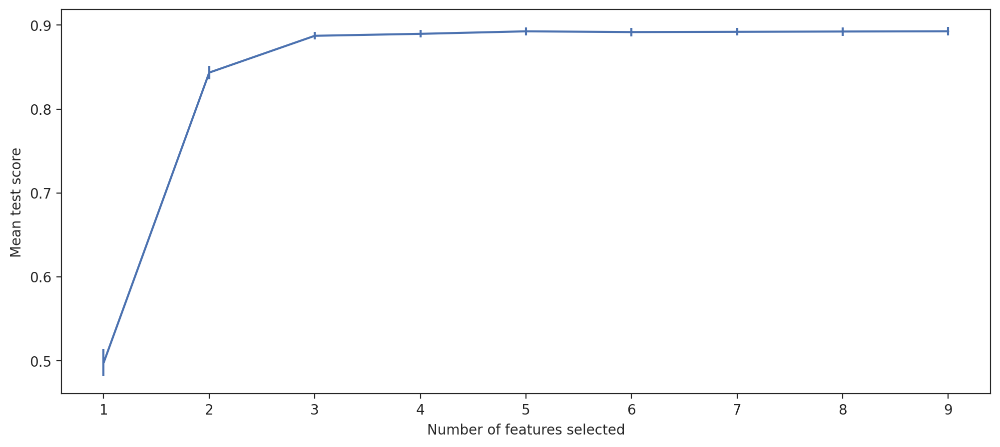

In [ ]:
fig, ax = plt.subplots(figsize=(12,5))
ax.errorbar(
    range(1, n_scores+1),
    rfe.cv_results_["mean_test_score"],
    yerr=rfe.cv_results_["std_test_score"],
)
ax.set_xlabel("Number of features selected")
ax.set_ylabel("Mean test score");

In [ ]:
selector = SelectKBest(f_regression, k=4).fit(X_train_poly, y_train)
# Get the indices of the selected features
selected_feature_indices = selector.get_support(indices=True)

# Get the names of the selected features
selected_feature_names = X_train_poly.columns[selected_feature_indices]
X_sel = selector.transform(X_train_poly)
# Create a new DataFrame with selected features
X_train_sel = pd.DataFrame(X_sel, columns=selected_feature_names)

X_val_sel = X_val_poly[X_train_sel.columns]
X_test_sel = X_test_poly[X_train_sel.columns]

# Now you can work with X_sel_df DataFrame
X_train_sel.shape


(22220, 4)

In [ ]:
X_train_sel.head(3)

,make,model,body,mileage age
45969,9.670999,9.644324,9.568900,0.000000
85122,9.740452,9.711802,9.603850,349.992857
115099,8.812503,8.735859,8.991884,258.100756


Lets fit into the dataset and evaluate to check if this will improve the model

In [ ]:
gbr  = create_regr_ppln(GradientBoostingRegressor(), X_train_sel, param_grid= gbr_param_grid)
rfr  = create_regr_ppln(RandomForestRegressor(), X_train_sel, param_grid= rfr_param_grid)
lr = create_regr_ppln(LinearRegression(), X_train_sel, linear_model=True, scaling= True, param_grid = lr_param_grid)

In [ ]:
models = [gbr, rfr, lr]

In [ ]:
model_results_list = []
for my_model in models:
    eval_results = cross_validate(
        my_model, X_train_sel, y_train, cv=5,
        scoring=['neg_mean_absolute_error', 'r2'],
        return_train_score=True
    )
    model_results_list.append((
    eval_results['test_r2'].mean(),
    eval_results['train_r2'].mean(),
    -eval_results['test_neg_mean_absolute_error'].mean(),
    eval_results['test_neg_mean_absolute_error'].std(),
    -eval_results['train_neg_mean_absolute_error'].mean(),
    eval_results['train_neg_mean_absolute_error'].std()

))

In [ ]:
model_results = pd.DataFrame(
    model_results_list,
    columns=['test_R2', 'train_R2', 'test_mae_mean', 'test_mae_std', 'train_mae_mean', 'train_mae_std',],
    index=['gbr', 'rfr', 'lr']
)

In [ ]:
model_results

,test_R2,train_R2,test_mae_mean,test_mae_std,train_mae_mean,train_mae_std
gbr,0.914801,0.950112,0.170110,0.002132,0.132459,0.014978
rfr,0.900776,0.929648,0.183489,0.002280,0.154475,0.009792
lr,0.839008,0.839308,0.247652,0.003147,0.247555,0.000887


In [ ]:
for est in models:
    est.fit(X_train_sel, y_train)

In [ ]:
ensemble = VotingRegressor(
    [
        ("gb", gbr),
        ("rf", rfr),
        ('lr', lr)
    ]
)
ensemble.fit(X_train_sel, y_train)

VotingRegressor(estimators=[('gb',
                             Pipeline(steps=[('preprocessor', None),
                                             ('ransea',
                                              RandomizedSearchCV(cv=5,
                                                                 estimator=GradientBoostingRegressor(),
                                                                 param_distributions={'criterion': ['squared_error',
                                                                                                    'friedman_mse'],
                                                                                      'max_depth': [5,
                                                                                                    6,
                                                                                                    7,
                                                                                                    8,
                                                                                                    9,
                                                                                                    10,
                                                                                                    11,
                                                                                                    12,
                                                                                                    13,
                                                                                                    14,
                                                                                                    15,
                                                                                                    16,
                                                                                                    17,
                                                                                                    18,
                                                                                                    19,
                                                                                                    20,
                                                                                                    21,
                                                                                                    22,
                                                                                                    23,
                                                                                                    24],
                                                                                      'max_features': [15,
                                                                                                       16,
                                                                                                       17,
                                                                                                       18,
                                                                                                       19,
                                                                                                       20,
                                                                                                       21,
                                                                                                       22,
                                                                                                       23,
                                                                                                       24,
                                                                                                       25,
                                                                                                       26,
                                                                       

In [ ]:
eval_results = cross_validate(
    ensemble, X_train_sel, y_train, cv=5,
    scoring=['neg_mean_absolute_error', 'r2'],
    return_train_score=True
)
ensemble_result = (
    eval_results['test_r2'].mean(),
    eval_results['train_r2'].mean(),
    -eval_results['test_neg_mean_absolute_error'].mean(),
    eval_results['test_neg_mean_absolute_error'].std(),
    -eval_results['train_neg_mean_absolute_error'].mean(),
    eval_results['train_neg_mean_absolute_error'].std()
)

In [ ]:
model_results.loc['ensemble'] = ensemble_result

In [ ]:
model_results

,test_R2,train_R2,test_mae_mean,test_mae_std,train_mae_mean,train_mae_std
gbr,0.915483,0.943173,0.170283,0.003554,0.142560,0.011851
rfr,0.900570,0.927444,0.184001,0.003332,0.156960,0.011152
lr,0.839008,0.839308,0.247652,0.003147,0.247555,0.000887
ensemble,0.901545,0.921733,0.185904,0.004528,0.167551,0.005278


## Inspection of Ensemble Output

In [ ]:
# quickly adapted from the sklearn documentation
# https://scikit-learn.org/stable/auto_examples/ensemble/plot_voting_regressor.html
xt = X_test_sel.head(1000)
yt = y_test.head(1000)
pred_gbr = gbr.predict(xt)
pred_rfr = rfr.predict(xt)
pred_lr = lr.predict(xt)
pred_ens = ensemble.predict(xt)

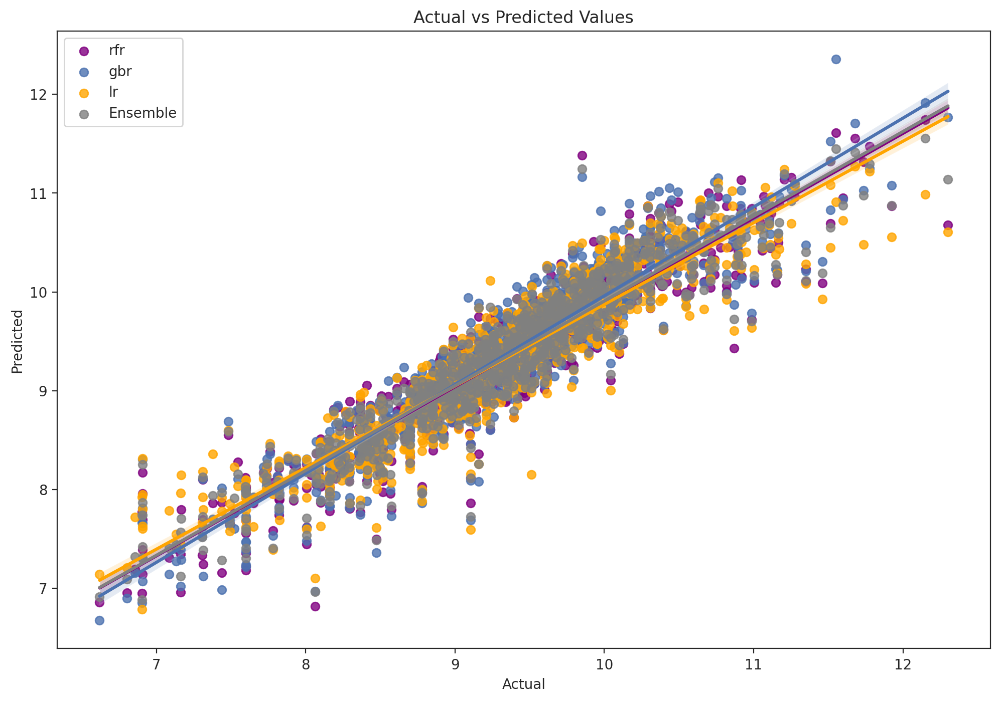

In [ ]:
fig, ax = plt.subplots(figsize=(12, 8))

sns.regplot(x=yt, y=pred_rfr, scatter_kws={"color": "purple"}, line_kws={"color": "purple"}, label="rfr")
sns.regplot(x=yt, y=pred_gbr, scatter_kws={"color": "b"}, line_kws={"color": "b"}, label="gbr")
sns.regplot(x=yt, y=pred_lr, scatter_kws={"color": "orange"}, line_kws={"color": "orange"}, label="lr")
sns.regplot(x= yt, y= pred_ens, scatter_kws={"color": "grey"}, line_kws={"color": "grey"}, label="Ensemble")
# sns.regplot(x= yt, y= pred_ens, scatter_kws={"color": "black"}, label="True values")


plt.title('Actual vs Predicted Values')
plt.xlabel('Actual')
plt.ylabel('Predicted')
ax.legend(loc="best");

plt.show()

lets see what a pairplot will look like

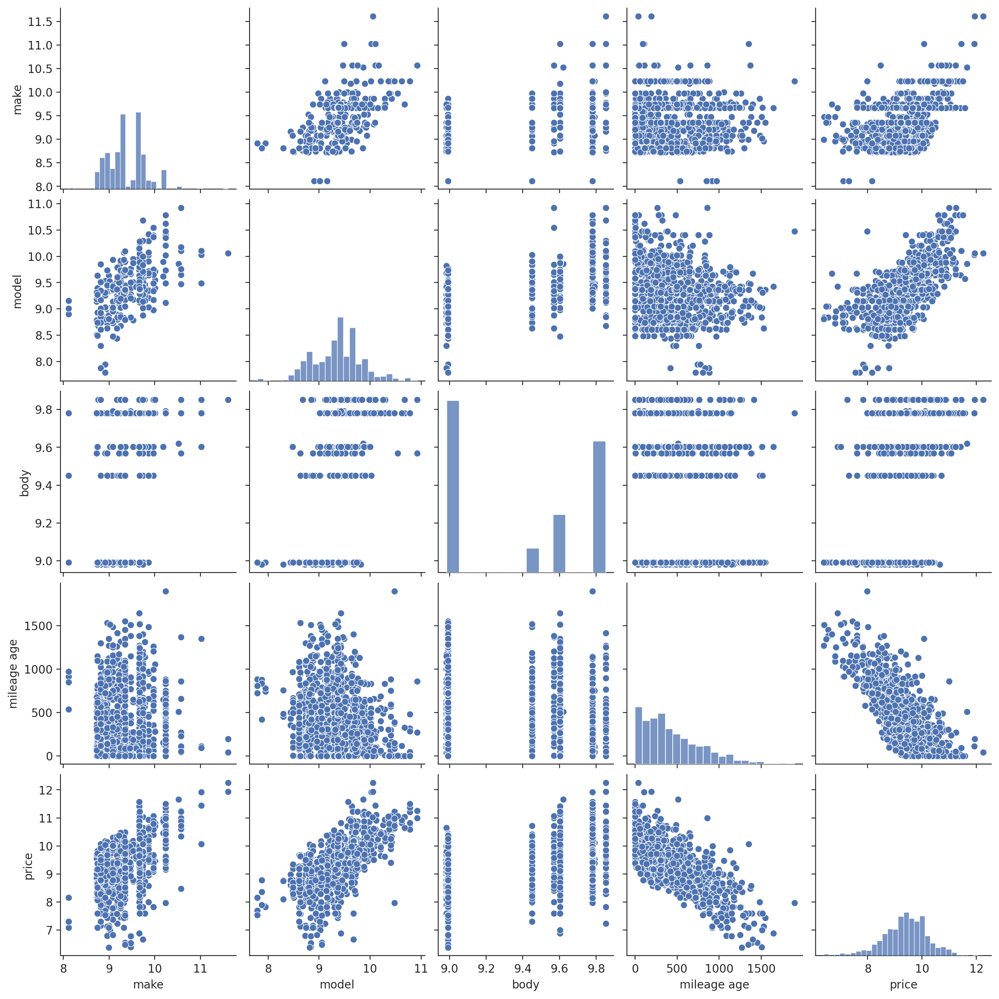

In [ ]:
pairplot = pd.concat([X_train_sel, y_train], axis=1)

sns.pairplot(pairplot.sample(frac=0.05));

Partial Dependency Plot

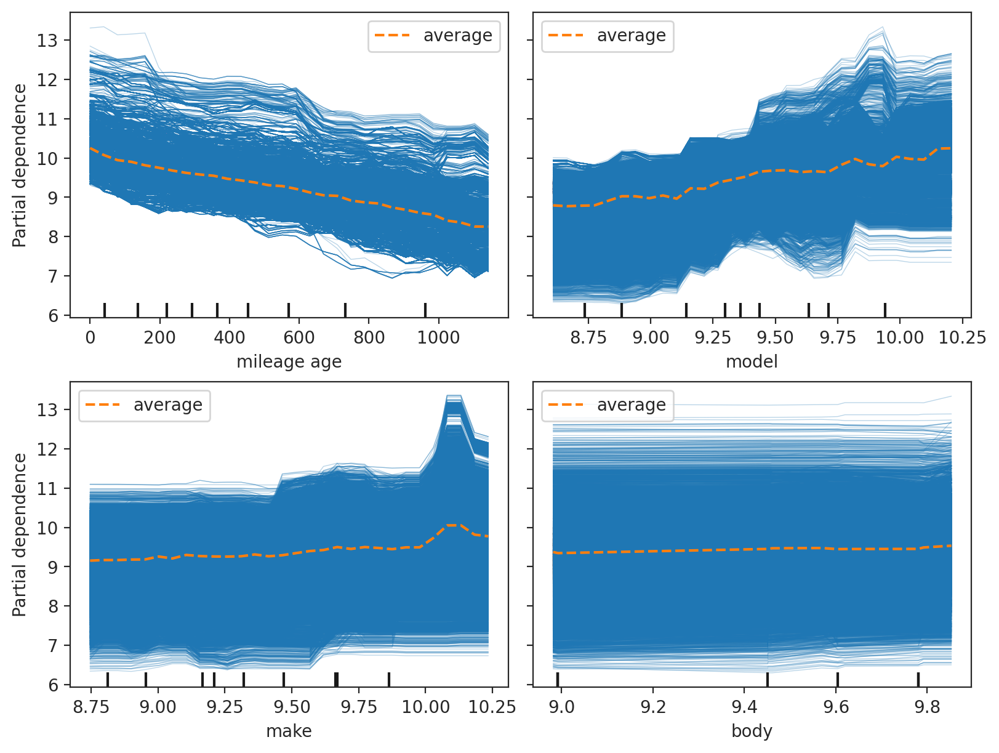

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    gbr, X_train_sel, features=['mileage age', 'model', 'make', 'body'],
    kind='both',
    subsample=30000, grid_resolution=30, n_jobs=2, random_state=0,
    ax=ax, n_cols=2
);

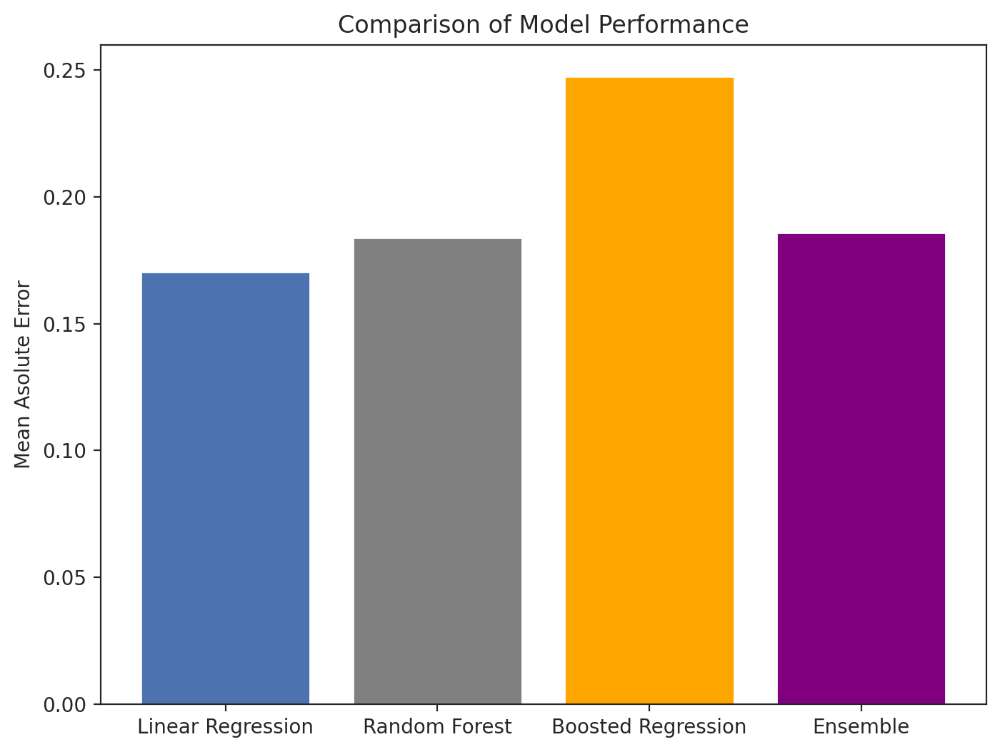

In [ ]:
# Calculating the Mean Squared Error for each model and plotting to make deductions.

plt.figure(figsize=(8,6))
gbr_test_mae_mean = model_results.loc['gbr', 'test_mae_mean']
rfr_test_mae_mean = model_results.loc['rfr', 'test_mae_mean']
lr_test_mae_mean = model_results.loc['lr', 'test_mae_mean']
ensemble_test_mae_mean = model_results.loc['ensemble', 'test_mae_mean']


models = ['Linear Regression', 'Random Forest', 'Boosted Regression', 'Ensemble']
mae_values = [gbr_test_mae_mean, rfr_test_mae_mean, lr_test_mae_mean, ensemble_test_mae_mean ]

plt.bar(models, mae_values, color=['b', 'grey', 'orange', 'purple'])
plt.ylabel('Mean Asolute Error')
plt.title('Comparison of Model Performance')
plt.show()

To see the best parameter combination that developed the best model

In [ ]:
grid_rfr = RandomizedSearchCV(RandomForestRegressor(random_state = 0), rfr_param_grid, cv =5)
grid_fit_rfr = grid_rfr.fit(X_train_sel, y_train)
best_rfr = grid_fit_rfr.best_estimator_
print('Best Estimator: ', best_rfr)

Best Estimator:  RandomForestRegressor(criterion='friedman_mse', max_depth=24, max_features=72,
                      min_samples_leaf=10, min_samples_split=10,
                      n_estimators=15, random_state=0)


In [ ]:
grid_gbr = RandomizedSearchCV(GradientBoostingRegressor(random_state = 0), gbr_param_grid, cv =5)
grid_fit_gbr = grid_gbr.fit(X_train_sel, y_train)
best_gbr = grid_fit_gbr.best_estimator_
print('Best Estimator: ', best_gbr)

Best Estimator:  GradientBoostingRegressor(max_depth=17, max_features=20, min_samples_leaf=29,
                          min_samples_split=11, n_estimators=46,
                          random_state=0)


Introducing shap values for model interpretation

In [ ]:
bestGbrModel = GradientBoostingRegressor(max_depth =17, max_features =20, min_samples_leaf =29, min_samples_split = 11, n_estimators =46, random_state = 0)
bestGbrModel.fit(X_train_sel, y_train)

GradientBoostingRegressor(max_depth=17, max_features=20, min_samples_leaf=29,
                          min_samples_split=11, n_estimators=46,
                          random_state=0)

In [ ]:
import shap
shap.initjs()

In [ ]:
explainer = shap.Explainer(bestGbrModel, X_train_sel)
shap_values = explainer(X_test_sel, check_additivity=False)

100%|===================| 9867/9876 [01:36<00:00]       

In [ ]:
shap_values = explainer(X_test_sel, check_additivity=False)

 99%|===================| 9793/9876 [01:38<00:00]       

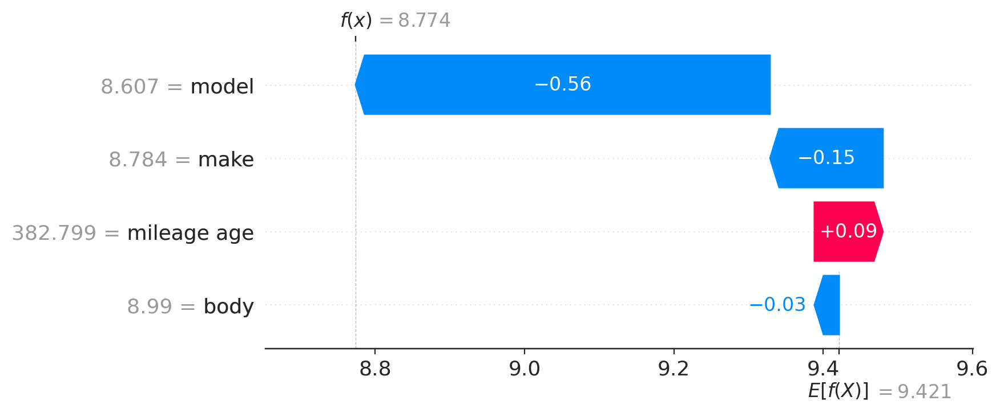

In [ ]:
shap.plots.waterfall(shap_values[1])

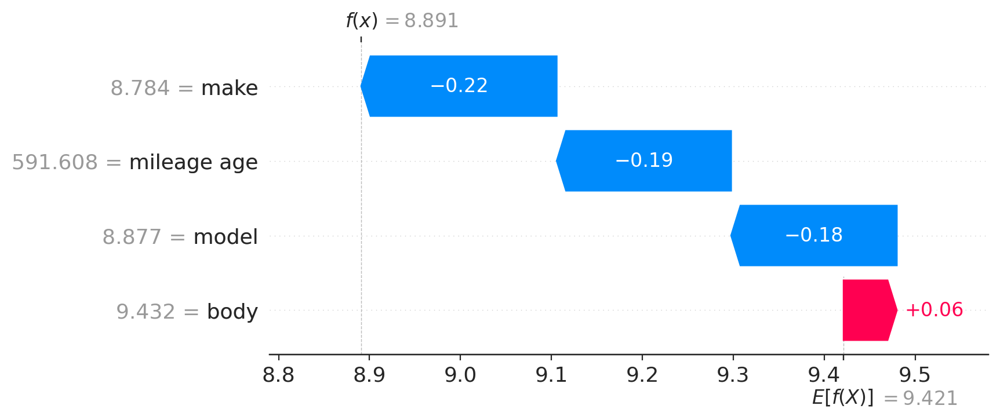

In [ ]:
shap.plots.waterfall(shap_values[0])

In [ ]:
shap.initjs()

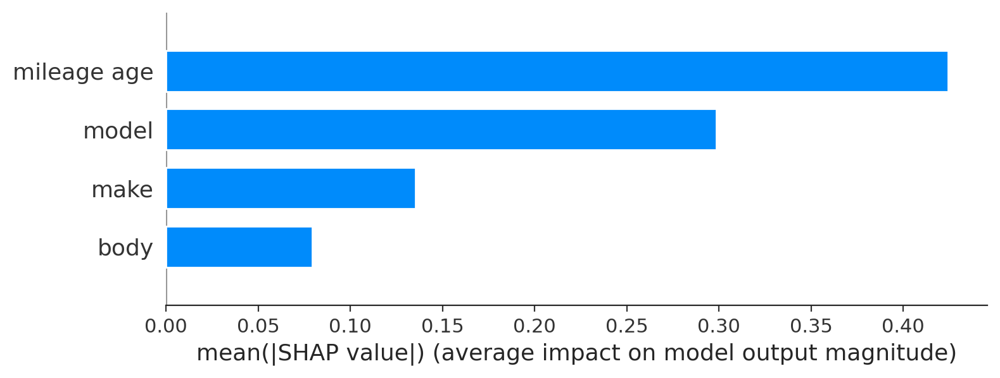

In [ ]:
shap.summary_plot(shap_values[0:], plot_type="bar")

In [ ]:
shap.plots.force(shap_values[0:30000])

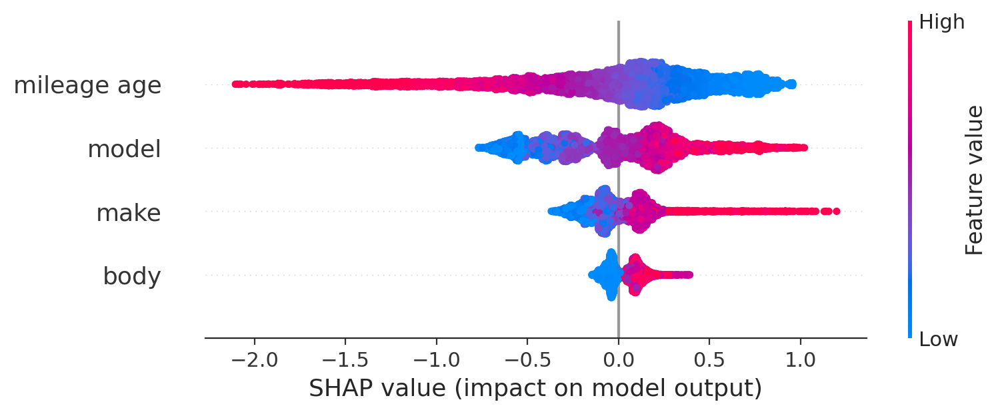

In [ ]:
shap.plots.beeswarm(shap_values)

To further trim down the dimensionality of the dataframe, i introduced PCA to see if having these features in separate and different space will improve the model

In [ ]:
compipe = Pipeline(steps=[
    ('pca', PCA(n_components=4))
]).set_output(transform='pandas')

In [ ]:
compipe.fit(X_train_poly)

Pipeline(steps=[('pca', PCA(n_components=4))])

In [ ]:
pred_pca = compipe.transform(X_train_poly)
pred_pca.head()

,pca0,pca1,pca2,pca3
45969,-446.009095,0.344184,0.061986,0.183198
85122,-96.016277,0.531279,0.035405,0.044422
115099,-187.908091,-0.973852,0.013745,0.021433
373608,188.025735,-0.360938,0.190083,-0.188355
173098,-62.770094,-0.413127,0.318305,0.062029


In [ ]:
pca_full = PCA()
pca_full.fit(X_train_poly)

PCA()

In [ ]:
pca_full.explained_variance_ratio_

array([9.99995285e-01, 3.32191989e-06, 7.60565097e-07, 3.66683536e-07,
       2.65841723e-07])

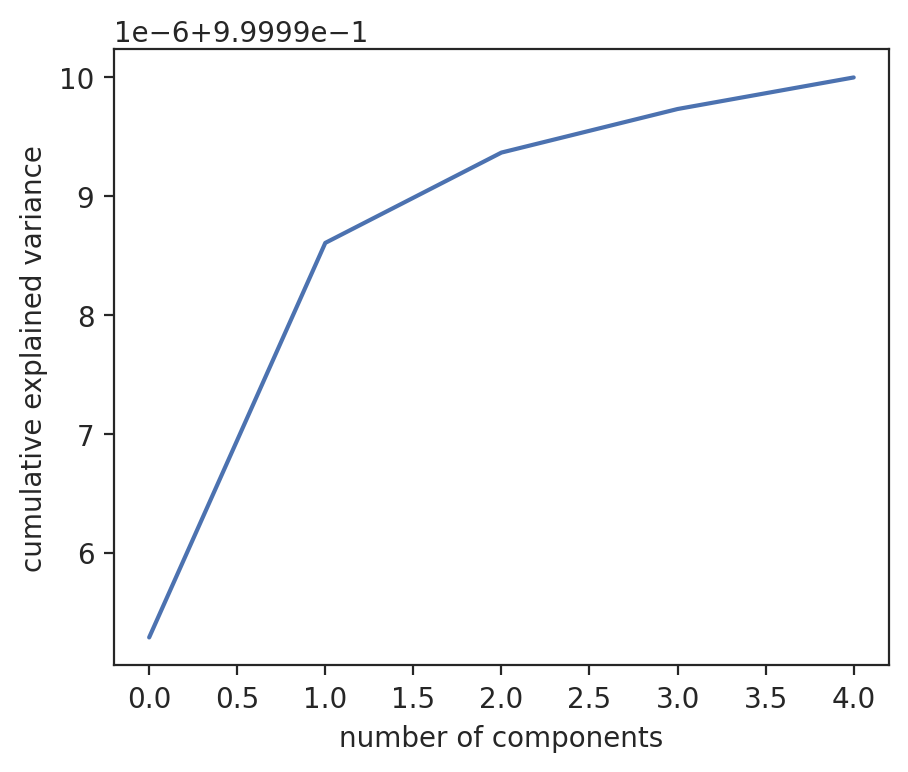

In [ ]:
plt.plot(np.cumsum(pca_full.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

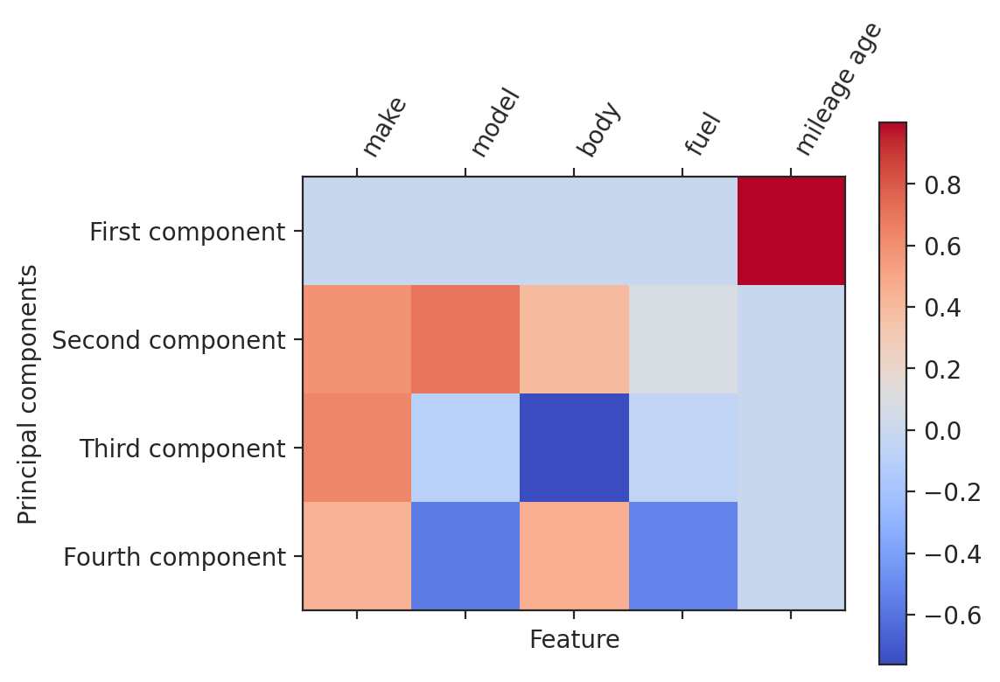

In [ ]:
plt.matshow(compipe['pca'].components_, cmap='coolwarm')
plt.yticks([0, 1, 2, 3], ["First component", "Second component", "Third component", "Fourth component"])
plt.colorbar()
plt.xticks(range(len(X_train_poly.columns)),
           X_train_poly.columns, rotation=60, ha='left')
plt.xlabel("Feature")
plt.ylabel("Principal components");

In [ ]:
gbr  = create_regr_ppln(GradientBoostingRegressor(), pred_pca, param_grid= gbr_param_grid)
rfr  = create_regr_ppln(RandomForestRegressor(), pred_pca, param_grid= rfr_param_grid)
lr = create_regr_ppln(LinearRegression(), pred_pca, linear_model=True, scaling= True, param_grid = lr_param_grid)

In [ ]:
models = [gbr, rfr, lr]

In [ ]:
model_results_list = []
for my_model in models:
    eval_results = cross_validate(
        my_model, pred_pca, y_train, cv=5,
        scoring=['neg_mean_absolute_error', 'r2'],
        return_train_score=True
    )
    model_results_list.append((
    eval_results['test_r2'].mean(),
    eval_results['train_r2'].mean(),
    -eval_results['test_neg_mean_absolute_error'].mean(),
    eval_results['test_neg_mean_absolute_error'].std(),
    -eval_results['train_neg_mean_absolute_error'].mean(),
    eval_results['train_neg_mean_absolute_error'].std()

))

In [ ]:
model_results = pd.DataFrame(
    model_results_list,
    columns=['test_R2', 'train_R2', 'test_mae_mean', 'test_mae_std', 'train_mae_mean', 'train_mae_std',],
    index=['gbr', 'rfr', 'lr']
)

In [ ]:
model_results

,test_R2,train_R2,test_mae_mean,test_mae_std,train_mae_mean,train_mae_std
gbr,0.900957,0.951002,0.180265,0.004086,0.127764,0.008802
rfr,0.891666,0.928511,0.190923,0.007379,0.155222,0.010920
lr,0.839714,0.840015,0.246269,0.003158,0.246167,0.000896


In [ ]:
for est in models:
    est.fit(pred_pca, y_train)

In [ ]:
ensemble = VotingRegressor(
    [
        ("gb", gbr),
        ("rf", rfr),
        ('lr', lr)
    ]
)
ensemble.fit(pred_pca, y_train)

VotingRegressor(estimators=[('gb',
                             Pipeline(steps=[('preprocessor', None),
                                             ('ransea',
                                              RandomizedSearchCV(cv=5,
                                                                 estimator=GradientBoostingRegressor(),
                                                                 param_distributions={'criterion': ['squared_error',
                                                                                                    'friedman_mse'],
                                                                                      'max_depth': [5,
                                                                                                    6,
                                                                                                    7,
                                                                                                    8,
                                                                                                    9,
                                                                                                    10,
                                                                                                    11,
                                                                                                    12,
                                                                                                    13,
                                                                                                    14,
                                                                                                    15,
                                                                                                    16,
                                                                                                    17,
                                                                                                    18,
                                                                                                    19,
                                                                                                    20,
                                                                                                    21,
                                                                                                    22,
                                                                                                    23,
                                                                                                    24],
                                                                                      'max_features': [15,
                                                                                                       16,
                                                                                                       17,
                                                                                                       18,
                                                                                                       19,
                                                                                                       20,
                                                                                                       21,
                                                                                                       22,
                                                                                                       23,
                                                                                                       24,
                                                                                                       25,
                                                                                                       26,
                                                                       

In [ ]:
eval_results = cross_validate(
    ensemble, pred_pca, y_train, cv=5,
    scoring=['neg_mean_absolute_error', 'r2'],
    return_train_score=True
)
ensemble_result = (
    eval_results['test_r2'].mean(),
    eval_results['train_r2'].mean(),
    -eval_results['test_neg_mean_absolute_error'].mean(),
    eval_results['test_neg_mean_absolute_error'].std(),
    -eval_results['train_neg_mean_absolute_error'].mean(),
    eval_results['train_neg_mean_absolute_error'].std()
)

In [ ]:
model_results.loc['ensemble'] = ensemble_result

In [ ]:
model_results

,test_R2,train_R2,test_mae_mean,test_mae_std,train_mae_mean,train_mae_std
gbr,0.900957,0.951002,0.180265,0.004086,0.127764,0.008802
rfr,0.891666,0.928511,0.190923,0.007379,0.155222,0.010920
lr,0.839714,0.840015,0.246269,0.003158,0.246167,0.000896
ensemble,0.892340,0.925931,0.191402,0.004635,0.159646,0.007146


# Without Polynomial features

In [ ]:
X_train.head()

,mileage,colour,make,model,condition,body,fuel,age,status,state
45969,3.162278,Black,Audi,TTS,NEW,Convertible,Petrol,0.000000,non_scrab,modern
85122,156.521564,Blue,Mercedes-Benz,C Class,USED,Saloon,Diesel,2.236068,non_scrab,modern
115099,129.050378,Silver,Vauxhall,Astra,USED,Hatchback,Petrol,2.000000,non_scrab,modern
373608,258.843582,Orange,MINI,Hatch,USED,Hatchback,Diesel,2.449490,non_scrab,modern
173098,191.619414,Blue,Volkswagen,Polo,USED,Hatchback,Petrol,2.000000,non_scrab,modern


Encode the categorical features for model building

In [ ]:
pipe_te.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('cat',
                                                  Pipeline(steps=[('te',
                                                                   TargetEncoder())]),
                                                  ['colour', 'make', 'model',
                                                   'condition', 'body', 'fuel',
                                                   'status', 'state'])],
                                   verbose_feature_names_out=False))])

In [ ]:
X_train = pipe_te['preprocessor'].transform(X_train)

In [ ]:
X_train.head()

,colour,make,model,condition,body,fuel,status,state,mileage,age
45969,9.463102,9.670999,9.644324,10.304689,9.568900,9.254172,9.396043,9.382098,3.162278,0.000000
85122,9.348781,9.740452,9.711802,9.314838,9.603850,9.447194,9.396043,9.382098,156.521564,2.236068
115099,9.059657,8.812503,8.735859,9.314838,8.991884,9.254172,9.396043,9.382098,129.050378,2.000000
373608,9.425556,9.210719,9.148945,9.314838,8.991884,9.447194,9.396043,9.382098,258.843582,2.449490
173098,9.348781,9.351018,9.051582,9.314838,8.991884,9.254172,9.396043,9.382098,191.619414,2.000000


Applying the same transformations on the test dataset

In [ ]:
pipe_te.fit(X_test, y_test)
X_test = pipe_te['preprocessor'].transform(X_test)

Applying the same transformations on the Validation dataset

In [ ]:
pipe_te.fit(X_val, y_val)
X_val = pipe_te['preprocessor'].transform(X_val)

Instantiating the models

In [ ]:
gbr  = create_regr_ppln(GradientBoostingRegressor(), X_train, param_grid= gbr_param_grid)
rfr  = create_regr_ppln(RandomForestRegressor(), X_train, param_grid= rfr_param_grid)
lr = create_regr_ppln(LinearRegression(), X_train, linear_model=True, param_grid = lr_param_grid)

In [ ]:
models = [gbr, rfr, lr]

In [ ]:
model_results_list = []
for my_model in models:
    eval_results = cross_validate(
        my_model, X_train, y_train, cv=5,
        scoring=['neg_mean_absolute_error', 'r2'],
        return_train_score=True
    )
    model_results_list.append((
    eval_results['test_r2'].mean(),
    eval_results['train_r2'].mean(),
    -eval_results['test_neg_mean_absolute_error'].mean(),
    eval_results['test_neg_mean_absolute_error'].std(),
    -eval_results['train_neg_mean_absolute_error'].mean(),
    eval_results['train_neg_mean_absolute_error'].std()
))

In [ ]:
model_results = pd.DataFrame(
    model_results_list,
    columns=['test_R2', 'train_R2', 'test_mae_mean', 'test_mae_std', 'train_mae_mean', 'train_mae_std',],
    index=['gbr', 'rfr', 'lr']
)

In [ ]:
model_results

,test_R2,train_R2,test_mae_mean,test_mae_std,train_mae_mean,train_mae_std
gbr,0.931465,0.970543,0.151416,0.001129,0.101618,0.002342
rfr,0.906634,0.929879,0.179273,0.006596,0.155097,0.014505
lr,0.831214,0.832120,0.251244,0.002325,0.250910,0.000383


In [ ]:
for est in models:
    est.fit(X_train, y_train)

In [ ]:
ensemble = VotingRegressor(
    [
        ("gb", gbr),
        ("rf", rfr),
        ('lr', lr)
    ]
)
ensemble.fit(X_train, y_train)

VotingRegressor(estimators=[('gb',
                             Pipeline(steps=[('preprocessor', None),
                                             ('ransea',
                                              RandomizedSearchCV(cv=5,
                                                                 estimator=GradientBoostingRegressor(),
                                                                 param_distributions={'criterion': ['squared_error',
                                                                                                    'friedman_mse'],
                                                                                      'max_depth': [5,
                                                                                                    6,
                                                                                                    7,
                                                                                                    8,
                                                                                                    9,
                                                                                                    10,
                                                                                                    11,
                                                                                                    12,
                                                                                                    13,
                                                                                                    14,
                                                                                                    15,
                                                                                                    16,
                                                                                                    17,
                                                                                                    18,
                                                                                                    19,
                                                                                                    20,
                                                                                                    21,
                                                                                                    22,
                                                                                                    23,
                                                                                                    24],
                                                                                      'max_features': [15,
                                                                                                       16,
                                                                                                       17,
                                                                                                       18,
                                                                                                       19,
                                                                                                       20,
                                                                                                       21,
                                                                                                       22,
                                                                                                       23,
                                                                                                       24,
                                                                                                       25,
                                                                                                       26,
                                                                       

In [ ]:
eval_results = cross_validate(
    ensemble, X_train, y_train, cv=5,
    scoring=['neg_mean_absolute_error', 'r2'],
    return_train_score=True
)
ensemble_result = (
    eval_results['test_r2'].mean(),
    eval_results['train_r2'].mean(),
    -eval_results['test_neg_mean_absolute_error'].mean(),
    eval_results['test_neg_mean_absolute_error'].std(),
    -eval_results['train_neg_mean_absolute_error'].mean(),
    eval_results['train_neg_mean_absolute_error'].std()
)

In [ ]:
model_results.loc['ensemble'] = ensemble_result

In [ ]:
model_results

,test_R2,train_R2,test_mae_mean,test_mae_std,train_mae_mean,train_mae_std
gbr,0.931465,0.970543,0.151416,0.001129,0.101618,0.002342
rfr,0.906634,0.929879,0.179273,0.006596,0.155097,0.014505
lr,0.831214,0.832120,0.251244,0.002325,0.250910,0.000383
ensemble,0.912827,0.937536,0.173576,0.002349,0.148324,0.003564


In [ ]:
grid_rfr = RandomizedSearchCV(RandomForestRegressor(random_state = 0), rfr_param_grid, cv =5)
grid_fit_rfr = grid_rfr.fit(X_train, y_train)
best_rfr = grid_fit_rfr.best_estimator_
print('Best Estimator: ', best_rfr)

Best Estimator:  RandomForestRegressor(max_depth=17, max_features='sqrt', min_samples_leaf=23,
                      min_samples_split=3, n_estimators=6, random_state=0)


In [ ]:
grid_gbr = RandomizedSearchCV(GradientBoostingRegressor(random_state = 0), gbr_param_grid, cv =5)
grid_fit_gbr = grid_gbr.fit(X_train, y_train)
best_gbr = grid_fit_gbr.best_estimator_
print('Best Estimator: ', best_gbr)

## Inspection of Ensemble Output

In [ ]:
# quickly adapted from the sklearn documentation
# https://scikit-learn.org/stable/auto_examples/ensemble/plot_voting_regressor.html
xt = X_train.head(100)
yt = y_train.head(100)
pred_gbr = gbr.predict(xt)
pred_rfr = rfr.predict(xt)
pred_lr = lr.predict(xt)
pred_ens = ensemble.predict(xt)

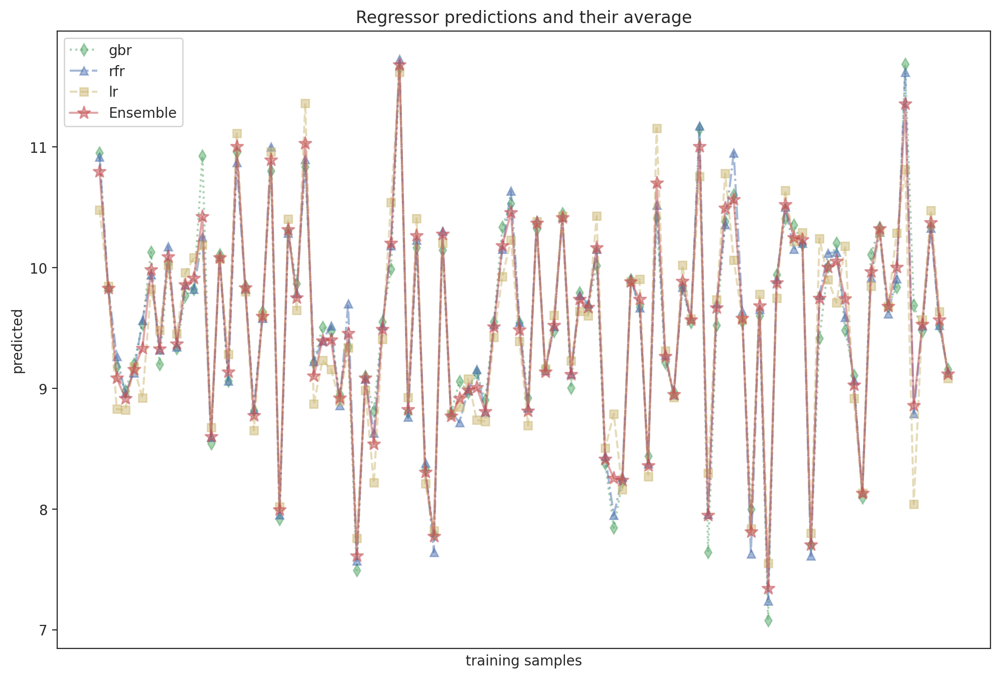

In [ ]:
fig, ax = plt.subplots(figsize=(12, 8))

ax.plot(pred_gbr, "gd:", alpha=0.5, label="gbr")
ax.plot(pred_rfr, "b^-.", alpha=0.5, label="rfr")
ax.plot(pred_lr, "ys--", alpha=0.5, label="lr")
ax.plot(pred_ens, "r*-", alpha=0.5, ms=10, label="Ensemble")
#ax.plot(yt, "ko", alpha=0.5, ms=3, label="True Data")

ax.tick_params(axis="x", which="both", bottom=False, top=False, labelbottom=False)
ax.set_ylabel("predicted")
ax.set_xlabel("training samples")
ax.legend(loc="best")
ax.set_title("Regressor predictions and their average");

plt.show()


Having to consider some feature importance and some possible feature elimination to improve the perfromance of the model

In [ ]:
lr.fit(X_train, y_train)
rfr.fit(X_train, y_train)
gbr.fit(X_train, y_train)

Pipeline(steps=[('preprocessor', None),
                ('ransea',
                 RandomizedSearchCV(cv=5, estimator=GradientBoostingRegressor(),
                                    param_distributions={'criterion': ['squared_error',
                                                                       'friedman_mse'],
                                                         'max_depth': [5, 6, 7,
                                                                       8, 9, 10,
                                                                       11, 12,
                                                                       13, 14,
                                                                       15, 16,
                                                                       17, 18,
                                                                       19, 20,
                                                                       21, 22,
                                                                       23, 24,
                                                                       25, 26,
                                                                       27, 28,
                                                                       29],
                                                         'max_features': [15,
                                                                          16,
                                                                          17,
                                                                          18,
                                                                          19,
                                                                          20,
                                                                          21,
                                                                          22,
                                                                          23,
                                                                          24,
                                                                          25,
                                                                          26,
                                                                          27,
                                                                          28,
                                                                          29,
                                                                          30,
                                                                          31,
                                                                          32,
                                                                          33,
                                                                          34,
                                                                          35,
                                                                          36,
                                                                          37,
                                                                          38,
                                                                          39,
                                                                          40,
                                                                          41,
                                                                          42,
                                                                          43,
                                                                          44, ...],
                                                         'min_samples_leaf': [5,
                                                                              6,
                                                                              7,
                                                                              8,
                                                          

In [ ]:
feat_coef = lr.named_steps['ransea'].best_estimator_.coef_
variable_names = X_train.columns
feat_df = pd.DataFrame({'Feature': variable_names, 'Relevance': feat_coef})
feat_df = feat_df.reindex(feat_df['Relevance'].abs().sort_values(ascending=False).index)
feat_df

,Feature,Relevance
9,age,-3.227692
1,make,2.160935
8,mileage,-1.485330
2,model,1.333981
7,state,-0.825634
3,condition,-0.593751
6,status,0.378150
5,fuel,0.219642
4,body,0.170290
0,colour,0.145478


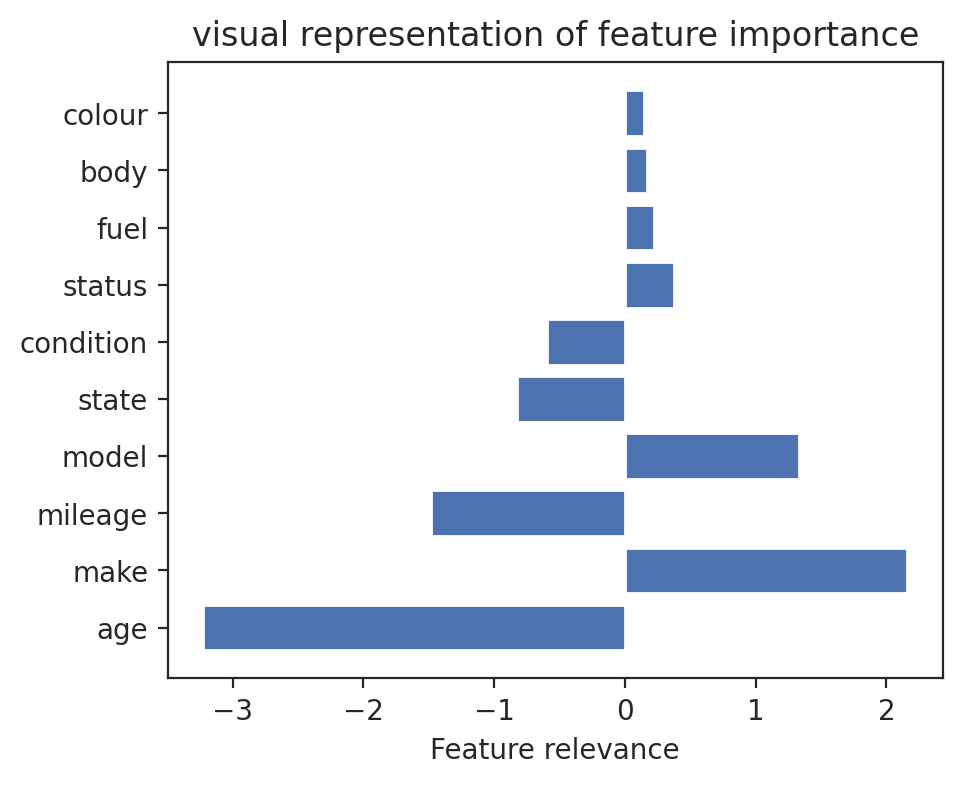

In [ ]:
plt.barh(feat_df['Feature'], feat_df['Relevance'])
plt.xlabel('Feature relevance')
plt.title('visual representation of feature importance');

In [ ]:
rfr_model = rfr.named_steps['ransea'].best_estimator_
variable_relevance = rfr_model.feature_importances_
variable_names = X_train.columns
rfr_df = pd.DataFrame({'Feature': variable_names, 'Relevance': variable_relevance})
rfr_df = rfr_df.sort_values(by = 'Relevance', ascending=False)
rfr_df

,Feature,Relevance
9,age,0.491106
2,model,0.317717
1,make,0.088278
8,mileage,0.085774
4,body,0.008801
5,fuel,0.006515
0,colour,0.001554
3,condition,0.000245
6,status,0.000011
7,state,0.000000


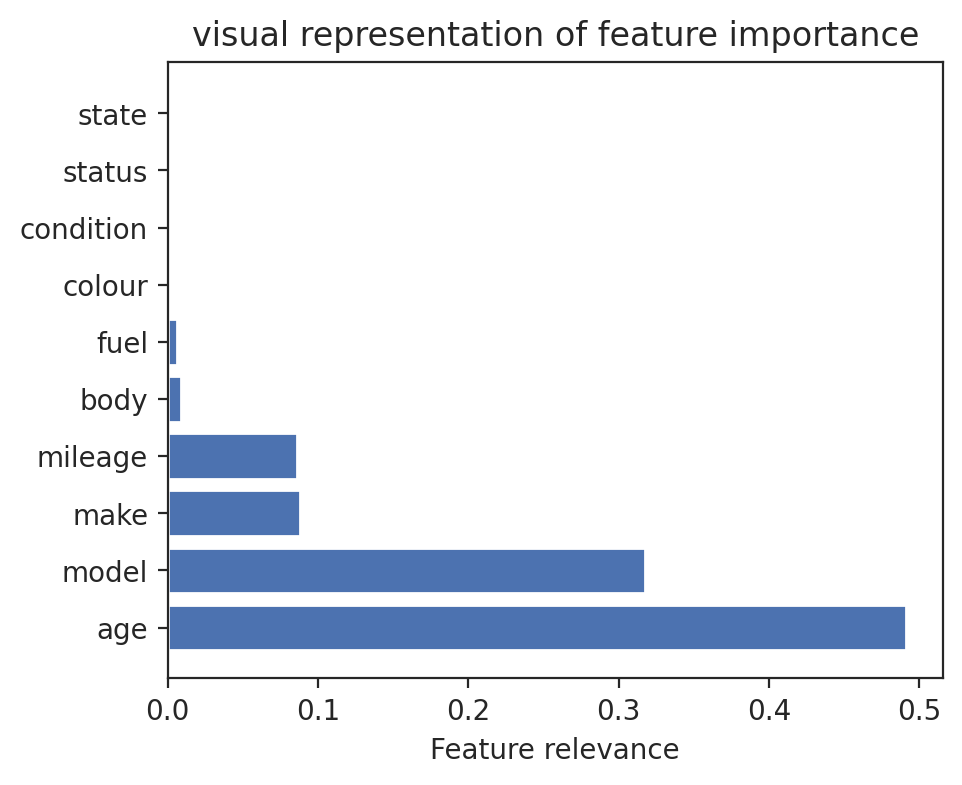

In [ ]:
plt.barh(rfr_df['Feature'], rfr_df['Relevance'])
plt.xlabel('Feature relevance')
plt.title('visual representation of feature importance');

In [ ]:
gbr_model = gbr.named_steps['ransea'].best_estimator_
variable_relevance = gbr_model.feature_importances_
variable_names = X_train.columns
gbr_df = pd.DataFrame({'Feature': variable_names, 'Relevance': variable_relevance})
gbr_df = gbr_df.sort_values(by = 'Relevance', ascending=False)
gbr_df

,Feature,Relevance
9,age,0.489908
2,model,0.324346
1,make,0.085709
8,mileage,0.081756
4,body,0.009902
5,fuel,0.006653
0,colour,0.001442
3,condition,0.000279
6,status,0.000006
7,state,0.000000


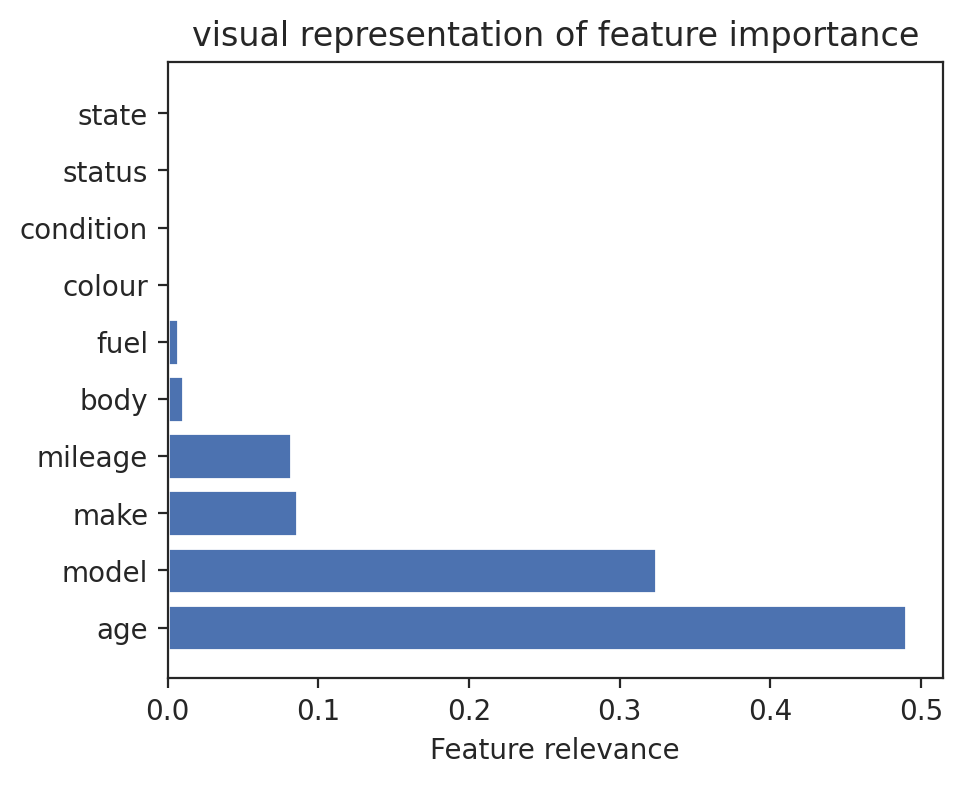

In [ ]:
plt.barh(gbr_df['Feature'], gbr_df['Relevance'])
plt.xlabel('Feature relevance')
plt.title('visual representation of feature importance');

In [ ]:
ensemble.fit(X_train, y_train)

VotingRegressor(estimators=[('gb',
                             Pipeline(steps=[('preprocessor', None),
                                             ('ransea',
                                              RandomizedSearchCV(cv=5,
                                                                 estimator=GradientBoostingRegressor(),
                                                                 param_distributions={'criterion': ['squared_error',
                                                                                                    'friedman_mse'],
                                                                                      'max_depth': [5,
                                                                                                    6,
                                                                                                    7,
                                                                                                    8,
                                                                                                    9,
                                                                                                    10,
                                                                                                    11,
                                                                                                    12,
                                                                                                    13,
                                                                                                    14,
                                                                                                    15,
                                                                                                    16,
                                                                                                    17,
                                                                                                    18,
                                                                                                    19,
                                                                                                    20,
                                                                                                    21,
                                                                                                    22,
                                                                                                    23,
                                                                                                    24,
                                                                                                    25,
                                                                                                    26,
                                                                                                    27,
                                                                                                    28,
                                                                                                    29],
                                                                                      'max_features': [15,
                                                                                                       16,
                                                                                                       17,
                                                                                                       18,
                                                                                                       19,
                                                                                                       20,
                                                                                                       21,
                                                                                      

In [ ]:
# Initialize empty lists to store feature importances and coefficients
all_variable_relevance = []
all_variable_coefficients = []


for estimator in ensemble.estimators_:

    model = estimator.named_steps['ransea'].best_estimator_
     # condition for linear model or otherwise
    if isinstance(model, LinearRegression):

        coefficients = model.coef_
        # standardize on equal scale
        normalized_coefficients = np.abs(coefficients) / np.sum(np.abs(coefficients))

        all_variable_coefficients.append(normalized_coefficients)
    else:

        variable_relevance = model.feature_importances_

        all_variable_relevance.append(variable_relevance)

# average feature importances across all estimators
average_variable_relevance = np.mean(all_variable_relevance, axis=0)

# average coefficients across all estimators
average_variable_coefficients = np.mean(all_variable_coefficients, axis=0)

combined_variable_relevance = average_variable_relevance + average_variable_coefficients

# create DataFrame for combined feature importances and coefficients
ensemble_df = pd.DataFrame({'Feature': variable_names, 'Combined Relevance': combined_variable_relevance})
ensemble_df = ensemble_df.sort_values(by='Combined Relevance', ascending=False)
ensemble_df


,Feature,Combined Relevance
9,age,0.797564
2,model,0.450212
1,make,0.291095
8,mileage,0.224092
7,state,0.078327
3,condition,0.056584
6,status,0.035887
5,fuel,0.026659
4,body,0.024018
0,colour,0.015561


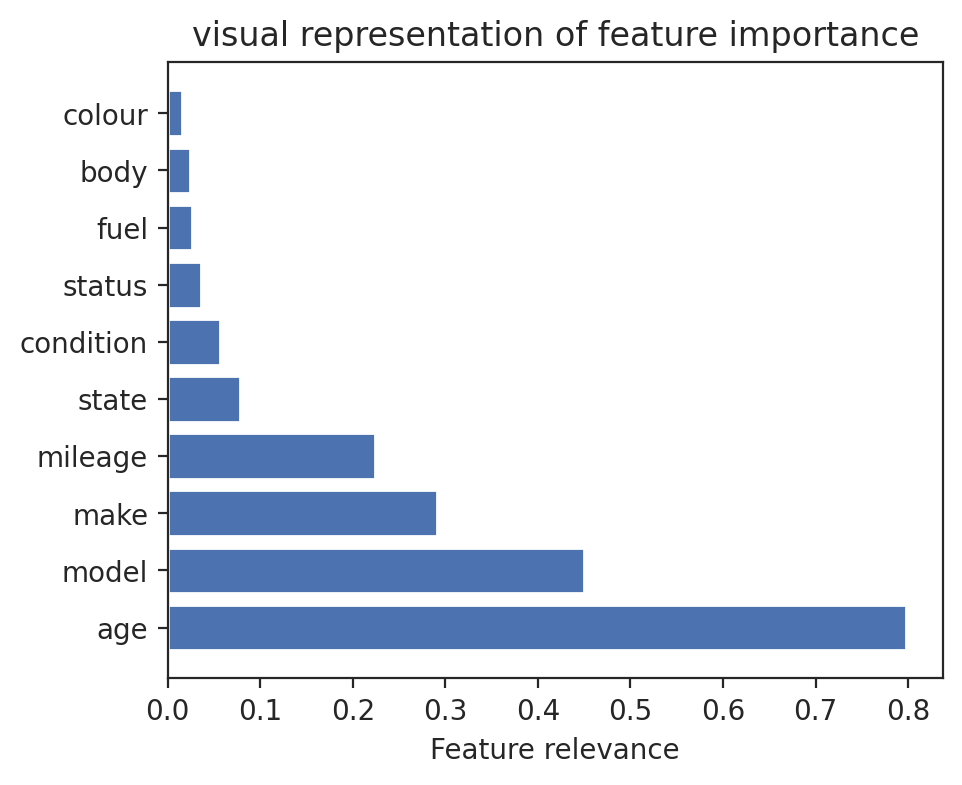

In [ ]:
plt.barh(ensemble_df['Feature'], ensemble_df['Combined Relevance'])
plt.xlabel('Feature relevance')
plt.title('visual representation of feature importance');

## Using recursive method for feature elimination

In [ ]:
# rfr  = create_regr_ppln(RandomForestRegressor(), X_train, param_grid= rfr_param_grid)
gbr.fit(X_train, y_train)

Pipeline(steps=[('preprocessor', None),
                ('ransea',
                 RandomizedSearchCV(cv=5, estimator=GradientBoostingRegressor(),
                                    param_distributions={'criterion': ['squared_error',
                                                                       'friedman_mse'],
                                                         'max_depth': [5, 6, 7,
                                                                       8, 9, 10,
                                                                       11, 12,
                                                                       13, 14,
                                                                       15, 16,
                                                                       17, 18,
                                                                       19, 20,
                                                                       21, 22,
                                                                       23, 24],
                                                         'max_features': [15,
                                                                          16,
                                                                          17,
                                                                          18,
                                                                          19,
                                                                          20,
                                                                          21,
                                                                          22,
                                                                          23,
                                                                          24,
                                                                          25,
                                                                          26,
                                                                          27,
                                                                          28,
                                                                          29,
                                                                          30,
                                                                          31,
                                                                          32,
                                                                          33,
                                                                          34,
                                                                          35,
                                                                          36,
                                                                          37,
                                                                          38,
                                                                          39,
                                                                          40,
                                                                          41,
                                                                          42,
                                                                          43,
                                                                          44, ...],
                                                         'min_samples_leaf': [5,
                                                                              6,
                                                                              7,
                                                                              8,
                                                                              9,
                                                                              10,
                                                                              11,
                                              

In [ ]:
# Get the best estimator from the pipeline
best_estimator = gbr.named_steps['ransea'].best_estimator_

# Instantiate the RFECV method with the best estimator
rfe = RFECV(best_estimator, step=1, cv=5)

# Fitting the dataset into the estimator
rfe.fit(X_train, y_train)

RFECV(cv=5,
      estimator=GradientBoostingRegressor(max_depth=17, max_features=16,
                                          min_samples_leaf=27,
                                          min_samples_split=11,
                                          n_estimators=48))

In [ ]:
X_train = rfe.transform(X_train)
X_train.head()

,make,model,body,fuel,mileage,age
45969,9.670999,9.644324,9.568900,9.254172,3.162278,0.000000
85122,9.740452,9.711802,9.603850,9.447194,156.521564,2.236068
115099,8.812503,8.735859,8.991884,9.254172,129.050378,2.000000
373608,9.210719,9.148945,8.991884,9.447194,258.843582,2.449490
173098,9.351018,9.051582,8.991884,9.254172,191.619414,2.000000


In [ ]:
n_scores = len(rfe.cv_results_["mean_test_score"])
n_scores

6

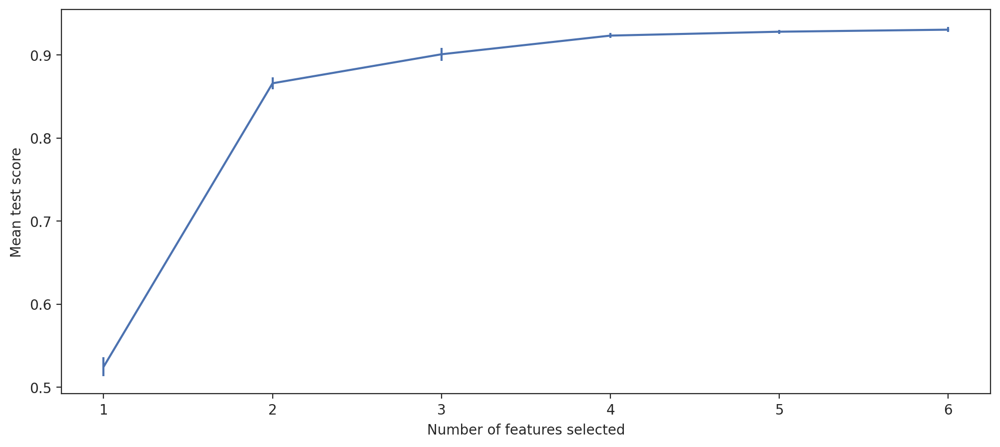

In [ ]:
fig, ax = plt.subplots(figsize=(12,5))
ax.errorbar(
    range(1, n_scores+1),
    rfe.cv_results_["mean_test_score"],
    yerr=rfe.cv_results_["std_test_score"],
)
ax.set_xlabel("Number of features selected")
ax.set_ylabel("Mean test score");

In [ ]:
selector = SelectKBest(f_regression, k=4).fit(X_train, y_train)
# Get the indices of the selected features
selected_feature_indices = selector.get_support(indices=True)

# Get the names of the selected features
selected_feature_names = X_train.columns[selected_feature_indices]
X_sel = selector.transform(X_train)
# Create a new DataFrame with selected features
X_train_sel = pd.DataFrame(X_sel, columns=selected_feature_names)

X_val_sel = X_val[X_train_sel.columns]
X_test_sel = X_test[X_train_sel.columns]

# Now you can work with X_sel_df DataFrame
X_train_sel.shape


(22220, 4)

In [ ]:
X_train_sel.head(3)

,make,model,mileage,age
45969,9.670999,9.644324,3.162278,0.000000
85122,9.740452,9.711802,156.521564,2.236068
115099,8.812503,8.735859,129.050378,2.000000


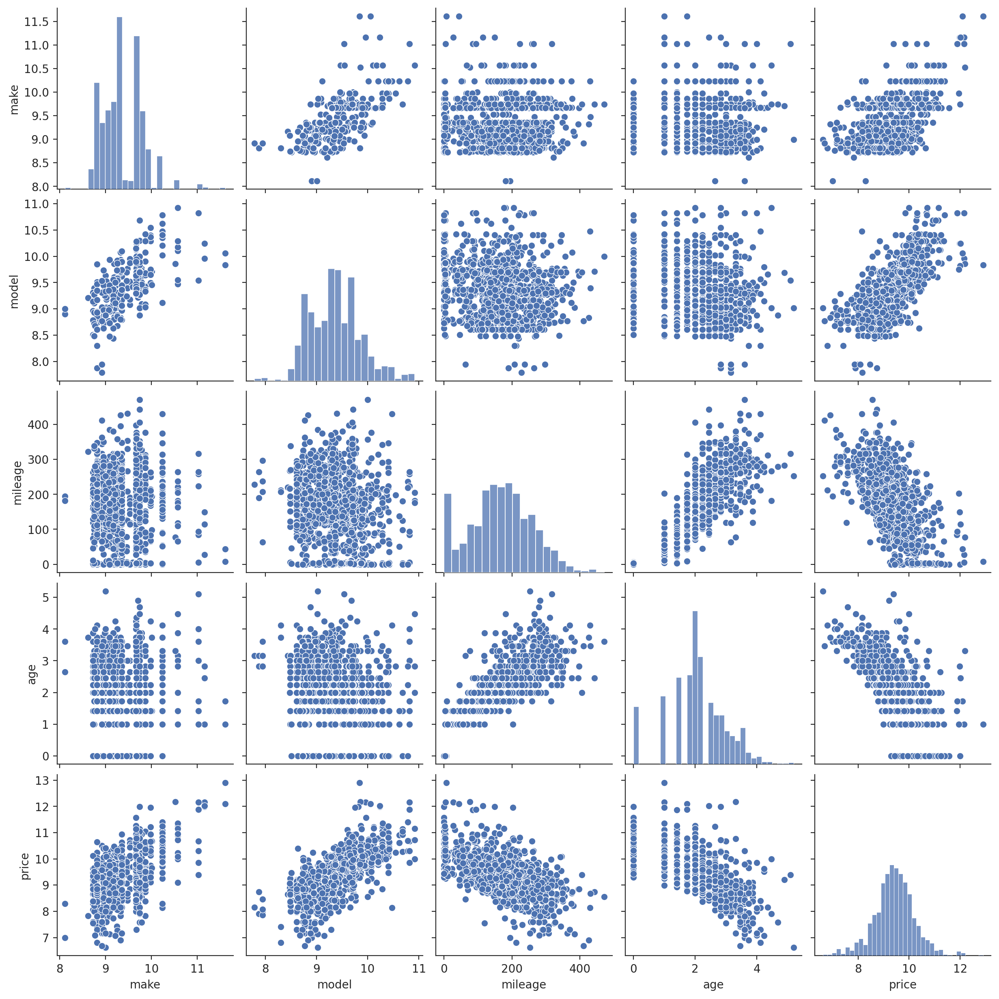

In [ ]:
pairplot = pd.concat([X_train_sel, y_train], axis=1)

sns.pairplot(pairplot.sample(frac=0.05));

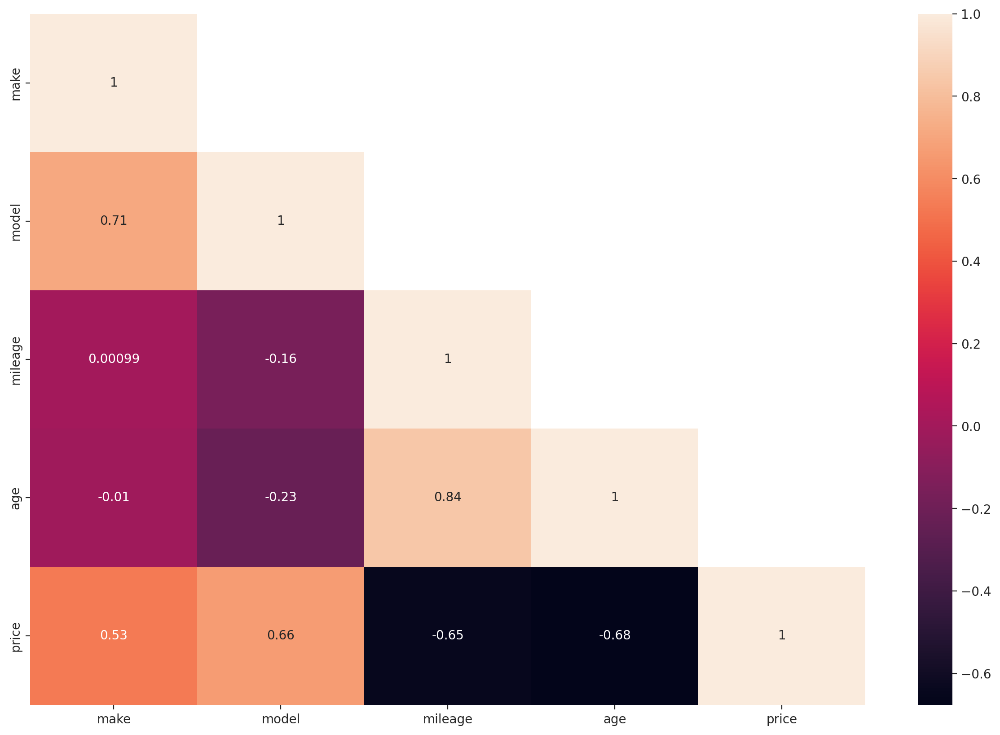

In [ ]:

plt.figure(figsize=(15, 10))
diag = np.triu(np.ones(pairplot.corr().shape, dtype=bool), k=1)
sns.heatmap(pairplot.corr(), mask = diag, annot=True);

## Lets see the performance of the model with this subset of dataframe

In [ ]:
gbr  = create_regr_ppln(GradientBoostingRegressor(), X_train_sel, param_grid= gbr_param_grid)
rfr  = create_regr_ppln(RandomForestRegressor(), X_train_sel, param_grid= rfr_param_grid)
lr = create_regr_ppln(LinearRegression(), X_train_sel, linear_model=True, param_grid = lr_param_grid)

In [ ]:
models = [gbr, rfr, lr]

In [ ]:
model_results_list = []
for my_model in models:
    eval_results = cross_validate(
        my_model, X_train_sel, y_train, cv=5,
        scoring=['neg_mean_absolute_error', 'r2'],
        return_train_score=True
    )
    model_results_list.append((
    eval_results['test_r2'].mean(),
    eval_results['train_r2'].mean(),
    -eval_results['test_neg_mean_absolute_error'].mean(),
    eval_results['test_neg_mean_absolute_error'].std(),
    -eval_results['train_neg_mean_absolute_error'].mean(),
    eval_results['train_neg_mean_absolute_error'].std()

))

In [ ]:
model_results = pd.DataFrame(
    model_results_list,
    columns=['test_R2', 'train_R2', 'test_mae_mean', 'test_mae_std', 'train_mae_mean', 'train_mae_std',],
    index=['gbr', 'rfr', 'lr']
)

In [ ]:
model_results

,test_R2,train_R2,test_mae_mean,test_mae_std,train_mae_mean,train_mae_std
gbr,0.923964,0.958748,0.161015,0.002935,0.121299,0.013001
rfr,0.906388,0.932403,0.179014,0.004220,0.152597,0.010823
lr,0.803244,0.803716,0.274967,0.002176,0.274784,0.000503


In [ ]:
for est in models:
    est.fit(X_train_sel, y_train)

In [ ]:
ensemble = VotingRegressor(
    [
        ("gb", gbr),
        ("rf", rfr),
        ('lr', lr)
    ]
)
ensemble.fit(X_train_sel, y_train)

VotingRegressor(estimators=[('gb',
                             Pipeline(steps=[('preprocessor', None),
                                             ('ransea',
                                              RandomizedSearchCV(cv=5,
                                                                 estimator=GradientBoostingRegressor(),
                                                                 param_distributions={'criterion': ['squared_error',
                                                                                                    'friedman_mse'],
                                                                                      'max_depth': [5,
                                                                                                    6,
                                                                                                    7,
                                                                                                    8,
                                                                                                    9,
                                                                                                    10,
                                                                                                    11,
                                                                                                    12,
                                                                                                    13,
                                                                                                    14,
                                                                                                    15,
                                                                                                    16,
                                                                                                    17,
                                                                                                    18,
                                                                                                    19,
                                                                                                    20,
                                                                                                    21,
                                                                                                    22,
                                                                                                    23,
                                                                                                    24],
                                                                                      'max_features': [15,
                                                                                                       16,
                                                                                                       17,
                                                                                                       18,
                                                                                                       19,
                                                                                                       20,
                                                                                                       21,
                                                                                                       22,
                                                                                                       23,
                                                                                                       24,
                                                                                                       25,
                                                                                                       26,
                                                                       

In [ ]:
eval_results = cross_validate(
    ensemble, X_train_sel, y_train, cv=5,
    scoring=['neg_mean_absolute_error', 'r2'],
    return_train_score=True
)
ensemble_result = (
    eval_results['test_r2'].mean(),
    eval_results['train_r2'].mean(),
    -eval_results['test_neg_mean_absolute_error'].mean(),
    eval_results['test_neg_mean_absolute_error'].std(),
    -eval_results['train_neg_mean_absolute_error'].mean(),
    eval_results['train_neg_mean_absolute_error'].std()
)

In [ ]:
model_results.loc['ensemble'] = ensemble_result

In [ ]:
model_results

,test_R2,train_R2,test_mae_mean,test_mae_std,train_mae_mean,train_mae_std
gbr,0.923964,0.958748,0.161015,0.002935,0.121299,0.013001
rfr,0.906388,0.932403,0.179014,0.004220,0.152597,0.010823
lr,0.803244,0.803716,0.274967,0.002176,0.274784,0.000503
ensemble,0.903712,0.926060,0.185218,0.002996,0.164922,0.004919


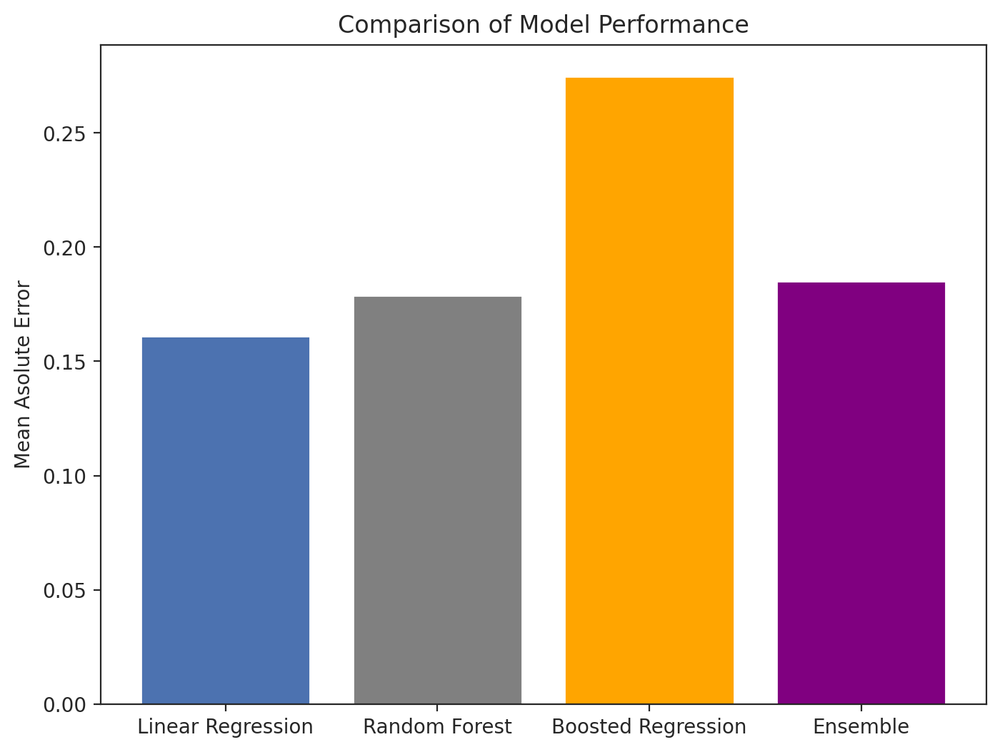

In [ ]:
# Calculating the Mean Squared Error for each model and plotting to make deductions.

plt.figure(figsize=(8,6))
gbr_test_mae_mean = model_results.loc['gbr', 'test_mae_mean']
rfr_test_mae_mean = model_results.loc['rfr', 'test_mae_mean']
lr_test_mae_mean = model_results.loc['lr', 'test_mae_mean']
ensemble_test_mae_mean = model_results.loc['ensemble', 'test_mae_mean']


models = ['Linear Regression', 'Random Forest', 'Boosted Regression', 'Ensemble']
mae_values = [gbr_test_mae_mean, rfr_test_mae_mean, lr_test_mae_mean, ensemble_test_mae_mean ]

plt.bar(models, mae_values, color=['b', 'grey', 'orange', 'purple'])
plt.ylabel('Mean Asolute Error')
plt.title('Comparison of Model Performance')
plt.show()

To Obtain the best parameters to build the best model

In [ ]:
grid_rfr = RandomizedSearchCV(RandomForestRegressor(random_state = 0), rfr_param_grid, cv =5)
grid_fit_rfr = grid_rfr.fit(X_train_sel, y_train)
best_rfr = grid_fit_rfr.best_estimator_
print('Best Estimator: ', best_rfr)

Best Estimator:  RandomForestRegressor(max_depth=17, max_features='sqrt', min_samples_leaf=23,
                      min_samples_split=3, n_estimators=6, random_state=0)


In [ ]:
grid_gbr = RandomizedSearchCV(GradientBoostingRegressor(random_state = 0), gbr_param_grid, cv =5)
grid_fit_gbr = grid_gbr.fit(X_train_sel, y_train)
best_gbr = grid_fit_gbr.best_estimator_
print('Best Estimator: ', best_gbr)

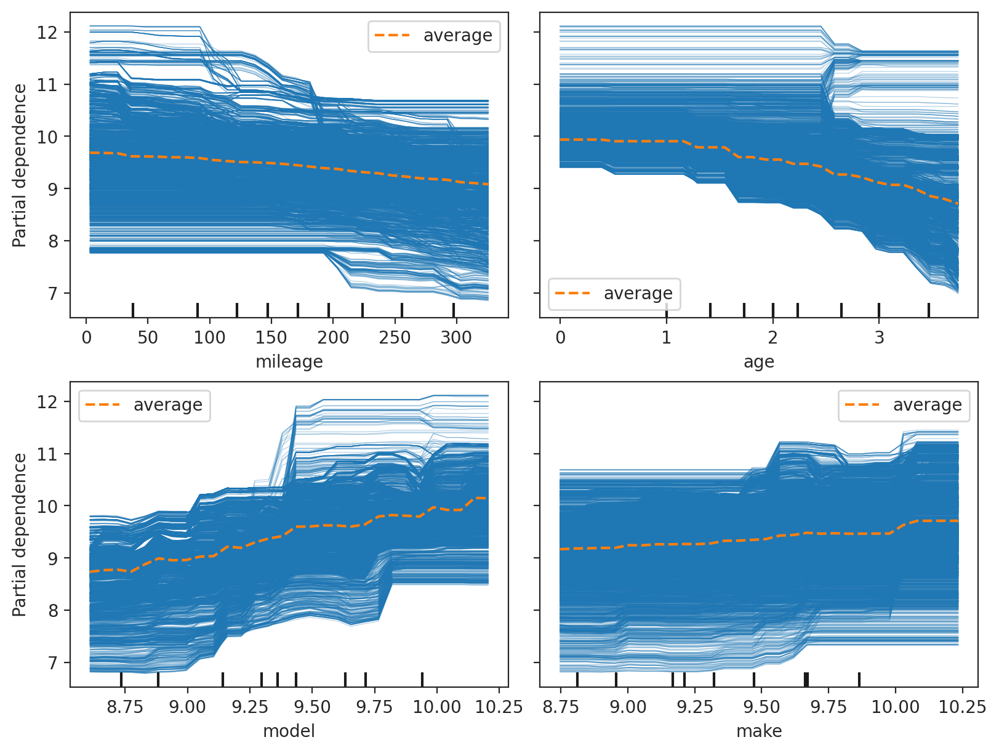

In [ ]:
fig, ax = plt.subplots(figsize=(8,6), constrained_layout=True)
PartialDependenceDisplay.from_estimator(
    rfr, X_train_sel, features=['mileage', 'age', 'model', 'make'],
    kind='both',
    subsample=5000, grid_resolution=30, n_jobs=2, random_state=0,
    ax=ax, n_cols=2
);

In [ ]:
compipe = Pipeline(steps=[
    ('pca', PCA(n_components= 4))
]).set_output(transform='pandas')

In [ ]:
compipe.fit(X_train_sel)

Pipeline(steps=[('pca', PCA(n_components=4))])

In [ ]:
pred_pca = compipe.transform(X_train_sel)
pred_pca.head()

,pca0,pca1,pca2,pca3
45969,-168.607459,0.497204,-0.569422,0.121421
85122,-15.234738,0.459837,0.355570,0.005213
115099,-42.705959,-0.981901,-0.043147,-0.000450
373608,87.085925,-0.216116,-0.516521,0.233245
173098,19.860484,-0.285376,-0.378054,0.334939


In [ ]:
pca_full = PCA()
pca_full.fit(X_train_sel)

PCA()

In [ ]:
pca_full.explained_variance_ratio_

array([9.99907012e-01, 4.80051833e-05, 2.97066909e-05, 1.05908050e-05,
       4.68567138e-06])

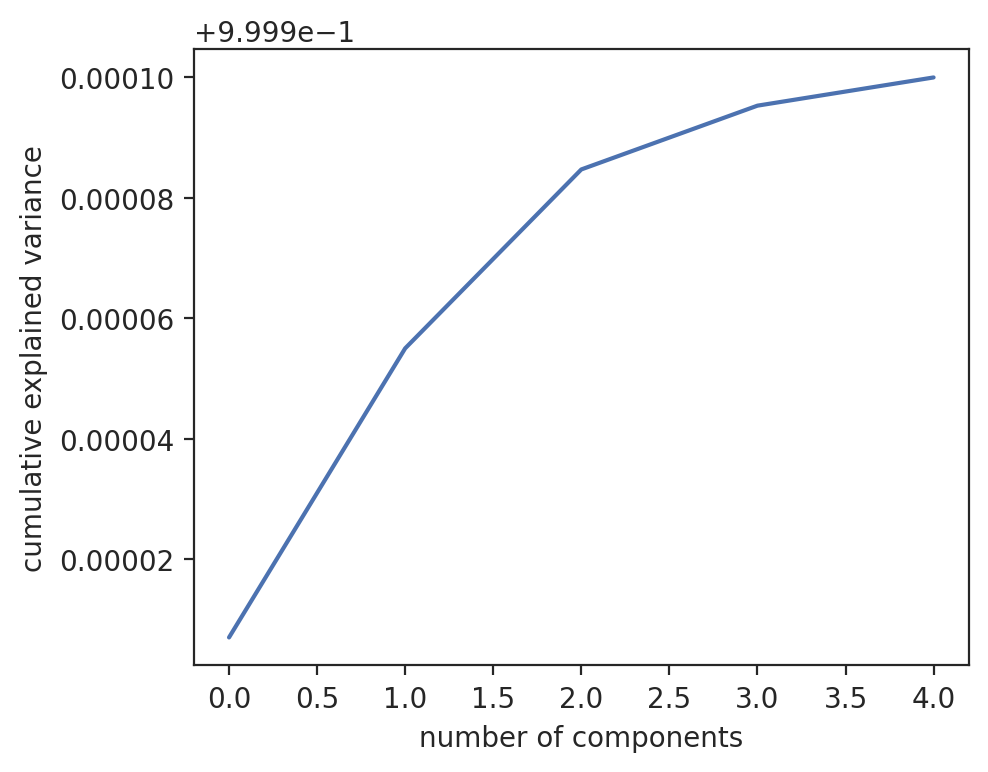

In [ ]:
plt.plot(np.cumsum(pca_full.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');

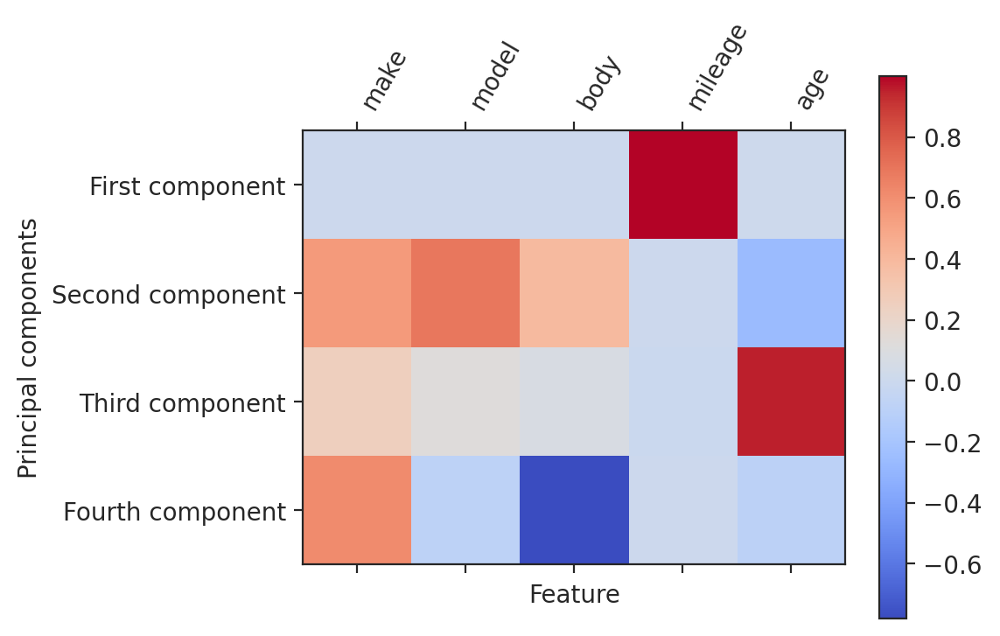

In [ ]:
plt.matshow(compipe['pca'].components_, cmap='coolwarm')
plt.yticks([0, 1, 2, 3], ["First component", "Second component", "Third component", "Fourth component"])
plt.colorbar()
plt.xticks(range(len(X_train_sel.columns)),
           X_train_sel.columns, rotation=60, ha='left')
plt.xlabel("Feature")
plt.ylabel("Principal components");

In [ ]:
gbr  = create_regr_ppln(GradientBoostingRegressor(), pred_pca, param_grid= gbr_param_grid)
rfr  = create_regr_ppln(RandomForestRegressor(), pred_pca, param_grid= rfr_param_grid)
lr = create_regr_ppln(LinearRegression(), pred_pca, linear_model=True, scaling= True, param_grid = lr_param_grid)

In [ ]:
models = [gbr, rfr, lr]

In [ ]:
model_results_list = []
for my_model in models:
    eval_results = cross_validate(
        my_model, pred_pca, y_train, cv=5,
        scoring=['neg_mean_absolute_error', 'r2'],
        return_train_score=True
    )
    model_results_list.append((
    eval_results['test_r2'].mean(),
    eval_results['train_r2'].mean(),
    -eval_results['test_neg_mean_absolute_error'].mean(),
    eval_results['test_neg_mean_absolute_error'].std(),
    -eval_results['train_neg_mean_absolute_error'].mean(),
    eval_results['train_neg_mean_absolute_error'].std()

))

In [ ]:
model_results = pd.DataFrame(
    model_results_list,
    columns=['test_R2', 'train_R2', 'test_mae_mean', 'test_mae_std', 'train_mae_mean', 'train_mae_std',],
    index=['gbr', 'rfr', 'lr']
)

In [ ]:
model_results

,test_R2,train_R2,test_mae_mean,test_mae_std,train_mae_mean,train_mae_std
gbr,0.856339,0.893551,0.227093,0.008911,0.194820,0.019674
rfr,0.879539,0.925420,0.206248,0.005251,0.160966,0.011252
lr,0.806546,0.806967,0.271743,0.002293,0.271612,0.000481


In [ ]:
for est in models:
    est.fit(pred_pca, y_train)

In [ ]:
ensemble = VotingRegressor(
    [
        ("gb", gbr),
        ("rf", rfr),
        ('lr', lr)
    ]
)
ensemble.fit(pred_pca, y_train)

VotingRegressor(estimators=[('gb',
                             Pipeline(steps=[('preprocessor', None),
                                             ('ransea',
                                              RandomizedSearchCV(cv=5,
                                                                 estimator=GradientBoostingRegressor(),
                                                                 param_distributions={'criterion': ['squared_error',
                                                                                                    'friedman_mse'],
                                                                                      'max_depth': [5,
                                                                                                    6,
                                                                                                    7,
                                                                                                    8,
                                                                                                    9,
                                                                                                    10,
                                                                                                    11,
                                                                                                    12,
                                                                                                    13,
                                                                                                    14,
                                                                                                    15,
                                                                                                    16,
                                                                                                    17,
                                                                                                    18,
                                                                                                    19,
                                                                                                    20,
                                                                                                    21,
                                                                                                    22,
                                                                                                    23,
                                                                                                    24,
                                                                                                    25,
                                                                                                    26,
                                                                                                    27,
                                                                                                    28,
                                                                                                    29],
                                                                                      'max_features': [15,
                                                                                                       16,
                                                                                                       17,
                                                                                                       18,
                                                                                                       19,
                                                                                                       20,
                                                                                                       21,
                                                                                      

In [ ]:
eval_results = cross_validate(
    ensemble, pred_pca, y_train, cv=5,
    scoring=['neg_mean_absolute_error', 'r2'],
    return_train_score=True
)
ensemble_result = (
    eval_results['test_r2'].mean(),
    eval_results['train_r2'].mean(),
    -eval_results['test_neg_mean_absolute_error'].mean(),
    eval_results['test_neg_mean_absolute_error'].std(),
    -eval_results['train_neg_mean_absolute_error'].mean(),
    eval_results['train_neg_mean_absolute_error'].std()
)

In [ ]:
model_results.loc['ensemble'] = ensemble_result

In [ ]:
model_results

,test_R2,train_R2,test_mae_mean,test_mae_std,train_mae_mean,train_mae_std
gbr,0.856339,0.893551,0.227093,0.008911,0.194820,0.019674
rfr,0.879539,0.925420,0.206248,0.005251,0.160966,0.011252
lr,0.806546,0.806967,0.271743,0.002293,0.271612,0.000481
ensemble,0.868515,0.896429,0.216054,0.002632,0.191370,0.006971


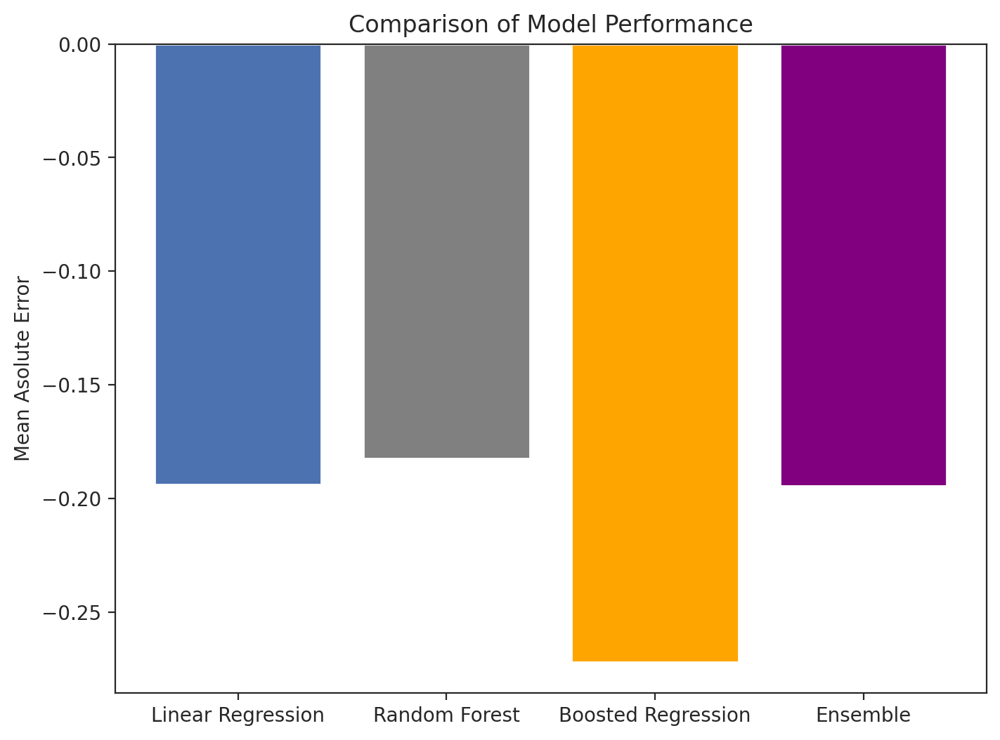